In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 50
VALIDATION_SPLIT = 0.1
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "sgd"
OUTLIER_CUTOFF = 94.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 1
CONV2D_NEURONS = [64, 64]
CONV2D_SIZE = ["(7, 7)", "(4, 4)"]
DENSE_LAYER_NEURONS = [32]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 1  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (94.0 percentile): 5.19
Number of outliers (|value| > 15.57): 181


Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


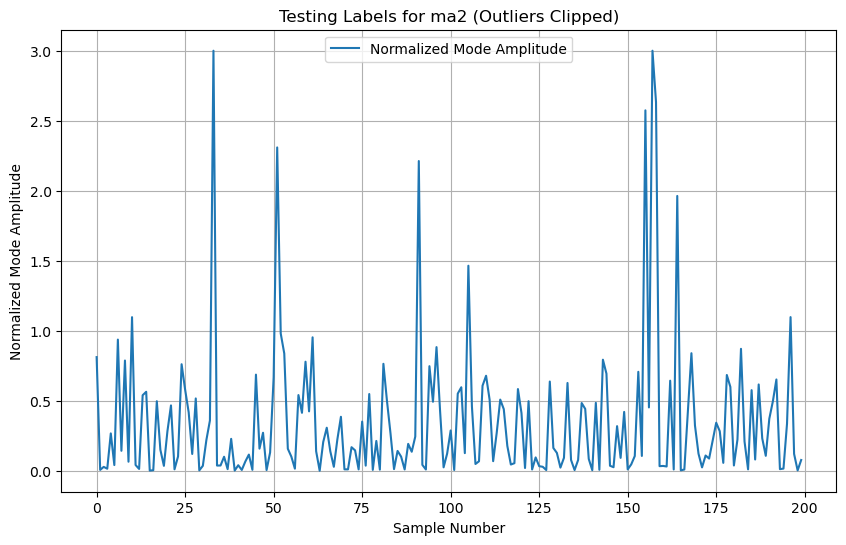

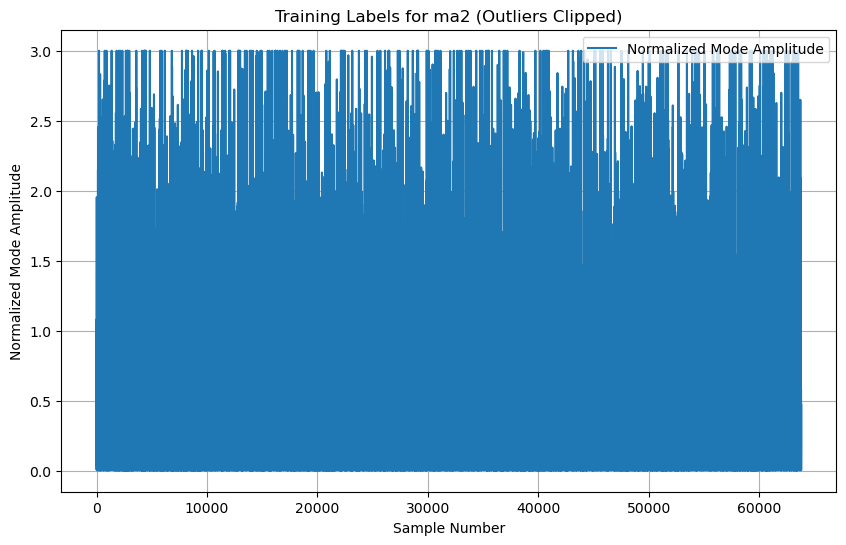

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 20, 20, 64)     │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       591,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 660,737 (2.52 MB)

 Trainable params: 660,737 (2.52 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 5:06 171ms/step - loss: 0.2580

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2910  

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.2660

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2538

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2482

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2476

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2486

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.2485

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.2488

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.2495

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.2496

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2494

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2491

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.2488

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2482

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.2478

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2475

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2469

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2460

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2449

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2444

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2433

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2421

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2410

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2399

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2382

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2371

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2361

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2353

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2344

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2336

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2330

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2323

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2316

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2309

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2300

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2291

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2283

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2275

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2267

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2259

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2253

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2248

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2243

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2239

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2235

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2231

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2227

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2222

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2217

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2213

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2208

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2203

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2198

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2193

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2187

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2182

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2177

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2172

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2167

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2162

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2157

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2152

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2147

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2142

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2137

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2132

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2127

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2122

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2118

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2113

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2109

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2105

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2100

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2096

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2092

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2088

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2084

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2080

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2076

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2072

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2068

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2065

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2061

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2058

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2054

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2051

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2048

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2044

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2041

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2038

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2035

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2031

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2028

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2025

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2022

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2019

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2016

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2013

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2010

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2008

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2005

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2002

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1999

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1997

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1994

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1992

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1989

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1987

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1985

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1982

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1980

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1978

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1976

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1974

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1972

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1971

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1969

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1967

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1965

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1963

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1961

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1959

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1958

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1957

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1955

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1954

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1953

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1952

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1950

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1949

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1947

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1946

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1944

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1943

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1941

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1939

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1938

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1936

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1934

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1933

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1931

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1930

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1928

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1927

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1926

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1924

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1923

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1922

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1922

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1920

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1919

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1918

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1917

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1915

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1914

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1913

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1912

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1911

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1909

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1908

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1907

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1906

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1905

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1904

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1903

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1901

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1900

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1899

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1898

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1897

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1896

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1895

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1894

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1893

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1892

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1891

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1890

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1888

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1887

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1887

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1886

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1885

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1884

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1883

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1882

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1881

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1880

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1879

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1878

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1877

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1876

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1876

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1875

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1874

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1873

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1872

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1872

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1871

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1870

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1869

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1869

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1868

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1867

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1867

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1866

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1865

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1865

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1864

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1863

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1863

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1862

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1861

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1861

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1860

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1860

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1859

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1858

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1858

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1857

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1857

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1856

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1856

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1855

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1854

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1854

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1854

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1853

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1852

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1852

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1851

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1851

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1850

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1850

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1849

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1849

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1848

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1848

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1847

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1847

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1846

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1846

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1845

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1845

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1844

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1844

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1844

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1844

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1843

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1843

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1842

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1842

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1842

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1841

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1841

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1841

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1840

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1840

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1840

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1839

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1839

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1839

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1838

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1838

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1837

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1837

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1836

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1836

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1835

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1835

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1834

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1834

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1833

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1833

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1832

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1832

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1831

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1831

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1830

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1830

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1829

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1829

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1828

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1828

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1827

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1827

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1826

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1826

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1825

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1825

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1824

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1824

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1823

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1823

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1822

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1822

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1821

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1821

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1820

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1820

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1819

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1819

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1818

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1818

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1817

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1817

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1816

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1816

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1816

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1815

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1815

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1814

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1814

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1813

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1813

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1812

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1812

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1811

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1811

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1810

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1810

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1810

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1809

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1809

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1808

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1808

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1808

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1807

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1807

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1806

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1806

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1805

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1805

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1805

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1804

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1804

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1803

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1803

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1802

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1802

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1802

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1801

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1801

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1800

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1800

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1799

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1799

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1799

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1798

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1798

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1797

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1797

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1797

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1796

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1796

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1795

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1795

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1795

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1794

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1794

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1793

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1793

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1793

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1792

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1792

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1792

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1791

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1791

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1790

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1790

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1790

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1789

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1789

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1789

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1789

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1788

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1788

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1788

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1787

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1787

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1787

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1786

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1786

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1785

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1785

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1785

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1784

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1784

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1784

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1783

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1783

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1783

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1782

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1782

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1782

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1781

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1781

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1781

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1780

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1780

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1780

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1779

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1779

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1779

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1778

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1778

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1778

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1777

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1777

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1777

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1777

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1776

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1776

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1776

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1775

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1775

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1775

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1774

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1774

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1774

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1774

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1773

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1773

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1773

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1772

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1772

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1772

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1772

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1772

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1771

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1771

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1771

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1771

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1770

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1770

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1770

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1769

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1769

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1769

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1769

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1768

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1768

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1768

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1768

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1767

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1767

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1767

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1767

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1766

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1766

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1766

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1766

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1765

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1765

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1765

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1765

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1764

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1764

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1764

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1764

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1763

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1763

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1763

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1763

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1762

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1762

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1762

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1762

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1761

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1761

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1761

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1761

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1760

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1760

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1760

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1760

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1759

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1759

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1759

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1759

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1759

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1758

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1758

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1758

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1758 

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1757

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1757

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1757

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1757

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1756

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1756

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1756

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1756

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1756

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1755

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1755

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1755

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1755

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1754

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1754

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1754

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1754

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1754

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1753

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1753

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1753

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1753

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1753

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1752

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1752

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1752

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1752

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1751

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1751

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1751

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1751

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1751

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1750

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1750

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1750

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1750

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1750

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1749

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1749

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1749

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1749

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1749

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1748

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1748

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1748

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1748

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1747

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1747

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1747

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1747

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1747

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1746

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1746

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1746

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1746

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1746

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1745

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1745

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1745

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1745

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1744

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1744

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1744

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1744

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1744

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1743

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1743

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1743

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1743

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1743

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1742

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1742

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1742

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1742

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1742

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1741

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1741

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1741

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1741

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1741

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1740

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1740

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1740

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1740

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1739

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1739

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1739

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1739

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1739

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1738

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1738

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1738

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1738

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1737

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1737

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1737

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1737

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1737

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1736

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1736

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1736

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1736

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1736

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1735

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1735

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1735

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1735

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1735

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1734

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1734

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1734

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1734

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1734

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1733

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1733

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1733

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1733

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1732

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1732

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1732

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1732

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1732

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1731

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1731

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1731

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1731

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1731

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1730

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1730

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1730

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1730

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1730

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1730

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1729

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1729

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1729

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1729

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1729

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1728

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1728

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1728

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1728

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1728

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1727

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1727

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1727

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1727 - val_loss: 0.1576


Epoch 2/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2809

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.2197

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.2044

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1883

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1788

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1735

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1697

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1653

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1614

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1592

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1586

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1577

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1566

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1554

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1541

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1536

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1533

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1529

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1524

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1519

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1515

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1512

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1509

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1506

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1504

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1502

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1498

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1495

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1492

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1490

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1488

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1487

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1484

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1482

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1481

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1479

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1478

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1476

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1475

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1473

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1470

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1468

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1466

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1463

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1461

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1458

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1456

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1454

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1452

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1451

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1449

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1448

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1447

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1445

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1445

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1444

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1444

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1444

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1444

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1444

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1444

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1444

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1443

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1443

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1443

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1443

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1443

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1443

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1443

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1443

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1443

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1444

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1444

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1444

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1444

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1444

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1445

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1445

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1445

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1445

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1445

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1445

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1445

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1445

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1445

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1444

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1444

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1444

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1444

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1443

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1443

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1443

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1443

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1444

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1444

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1444

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1445

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1445

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1445

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1446

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1446

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1447

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1447

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1447

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1448

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1448

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1448

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1449

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1449

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1449

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1449

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1450

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1450

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1450

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1450

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1450

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1451

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1451

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1451

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1451

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1451

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1452

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1452

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1452

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1452

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1452

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1453

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1453

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1453

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1453

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1453

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1453

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1454

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1454

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1454

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1454

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1454

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1454

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1454

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1454

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1454

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1454

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1454

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1454

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1455

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1455

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1455

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1455

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1455

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1455

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1455

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1455

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1455

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1455

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1455

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1455

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1455

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1455

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1455

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1455

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1455

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1455

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1455

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1455

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1455

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1455

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1455

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1455

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1455

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1455

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1455

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1455

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1455

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1455

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1455

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1455

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1454

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1454

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1454

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1454

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1454

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1454

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1454

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1454

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1454

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1454

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1454

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1454

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1454

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1454

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1454

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1454

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1453

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1453

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1453

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1453

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1453

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1453

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1453

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1453

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1453

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1452

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1452

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1452

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1452

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1452

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1452

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1451

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1451

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1450

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1450

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1450

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1450

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1450

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1449

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1449

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1449

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1449

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1449

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1449

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1449

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1448

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1448

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1448

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1448

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1448

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1448

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1448

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1448

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1448

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1447

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1447

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1447

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1447

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1447

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1447

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1447

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1447

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1447

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1447

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1446

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1446

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1446

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1446

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1446

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1446

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1446

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1446

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1446

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1445

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1445

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1445

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1445

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1445

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1445

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1445

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1445

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1444

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1444

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1444

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1444

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1444

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1444

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1444

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1443

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1443

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1443

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1443

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1443

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1443

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1443

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1443

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1443

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1443

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1442

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1442

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1441

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1440

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1440

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1440

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1440

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1440

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1440

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1440

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1440

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1440

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1440

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1440

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1440

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1439

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1439

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1439

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1439

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1439

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1439

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1439

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1439

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1439

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1439

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1438

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1437

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1437

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1436

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1436

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1435

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1435

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1435

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1435

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1435

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1434

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1434

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1434

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1434

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1434

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1434

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1434

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1433

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1433

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1433

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1433

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1433

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1433

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1433

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1433

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1433

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1433

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1432

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1432

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1432

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1432

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1432

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1432

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1432

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1432

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1432

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1432

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1431

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1431

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1431 

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1430

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1430

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1429

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1429

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1429

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1429

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1429

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1429

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1428

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1428

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1428

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1428

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1428

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1428

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1428

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1427

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1427

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1426

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1426

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1426

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1426

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1426

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1426

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1426

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1426

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1426

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1426

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1426

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1426

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1425

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1425

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1425

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1425

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1425

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.1425 - val_loss: 0.1888


Epoch 3/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.2677

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.2376

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.2021

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1820

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1703

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1624

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1593

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1584

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1578

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1573

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1568

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1560

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1550

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1540

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1533

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1532

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1530

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1528

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1523

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1517

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1510

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1504

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1499

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1494

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1490

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1485

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1482

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1479

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1477

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1474

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1471

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1469

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1465

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1462

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1458

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1454

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1450

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1446

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1442

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1439

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1435

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1432

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1429

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1426

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1424

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1422

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1420

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1418

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1416

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1415

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1413

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1412

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1411

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1411

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1410

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1409

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1408

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1408

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1407

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1406

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1404

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1404

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1403

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1403

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1402

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1402

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1402

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1401

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1401

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1402

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1402

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1402

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1402

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1402

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1403

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1403

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1404

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1404

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1405

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1405

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1406

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1406

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1406

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1407

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1407

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1407

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1408

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1408

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1408

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1409

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1409

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1409

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1409

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1410

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1410

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1410

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1410

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1410

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1411

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1411

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1411

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1411

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1411

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1412

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1411

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1411

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1411

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1411

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1411

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1411

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1411

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1411

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1411

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1411

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1411

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1411

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1411

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1412

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1413

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1413

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1413

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1413

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1413

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1413

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1413

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1413

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1413

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1413

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1414

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1414

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1414

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1414

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1414

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1414

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1414

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1414

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1414

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1413

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1413

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1413

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1413

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1413

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1413

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1413

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1413

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1413

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1413

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1412

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1412

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1412

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1412

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1412

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1412

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1412

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1411

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1411

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1411

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1411

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1411

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1411

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1411

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1411

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1410

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1410

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1410

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1410

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1410

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1409

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1409

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1409

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1409

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1409

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1409

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1409

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1409

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1409

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1408

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1408

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1408

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1408

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1407

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1406

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1406

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1405

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1405

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1405

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1405

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1405

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1405

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1405

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1405

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1405

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1405

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1405

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1405

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1405

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1404

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1404

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1404

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1404

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1404

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1403

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1403

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1402

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1401

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1401

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1401

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1401

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1401

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1401

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1401

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1401

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1401

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1401

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1401

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1400

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1400

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1400

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1400

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1400

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1400

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1400

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1400

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1400

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1400

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1399

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1398

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1398

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1398

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1398

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1398

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1398

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1398

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1398

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1398

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1398

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1397

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1397

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1397

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1397

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1397

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1397

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1397

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1397

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1397

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1397

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1396

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1396

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1396

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1396

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1396

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1396

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1396

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1396

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1396

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1396

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1395

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1395

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1395

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1395

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1395

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1395

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1395

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1395

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1395

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1395

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1394

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1394

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1394

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1394

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1394

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1394

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1394

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1394

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1394

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1394

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1394

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1393

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1393

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1393

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1393

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1393

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1393

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1393

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1393

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1393

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1393

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1392

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1391

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1391

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1391

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1391

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1391

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1391

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1391

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1391

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1391

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1390

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1390

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1390

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1390

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1390

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1390

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1390

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1390

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1390

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1390

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1390

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1389

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1388

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388 

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1388

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1387

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1387

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1387

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1387

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1387

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1387

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1387

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1387

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1387

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1387

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1387

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1386

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1386

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1386

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1386

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1386

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1386

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1386

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1386

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1386

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1386

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1386

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1386

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1385

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1384

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1384

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1384

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1384

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1384

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1384

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1384

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1384

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1384

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1384

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1384

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1384

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1383

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1383

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1383

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1383

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1383

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1383

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1383

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1383

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1383

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1383

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1383

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1382

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1382

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1382

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1381

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1381

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1381

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1381

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1381

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1381

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1381

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1381

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1381

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1380

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1380

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1380

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1380

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1380

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1379

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1379

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1379

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1379

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1379

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1379

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1379

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1379

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1379

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1379

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1379

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1379

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1379

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1379

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1378

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1378

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1378

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1378

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1378

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1378

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1378

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1378

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1378

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1378

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1378

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1378

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1377

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1377

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1377

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1377

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1377

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1377

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1377

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1377

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1377

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1377

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1377

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1377

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1376

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1376 - val_loss: 0.1256


Epoch 4/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1148

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1135

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1101

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1049

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1055

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1068

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1071

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1073

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1071

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1078

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1083

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1091

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1094

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1096

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1097

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1097

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1094

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1095

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1099

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1107

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1115

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1120

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1123

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1127

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1130

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1134

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1137

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1140

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1141

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1143

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1146

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1148

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1152

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1155

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1158

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1162

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1165

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1167

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1168

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1171

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1174

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1178

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1181

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1184

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1187

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1189

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1191

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1192

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1194

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1195

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1197

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1199

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1200

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1201

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1202

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1204

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1205

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1206

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1207

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1208

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1210

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1211

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1212

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1213

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1213

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1214

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1214

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1215

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1215

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1216

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1216

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1217

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1217

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1218

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1219

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1219

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1219

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1220

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1220

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1220

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1220

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1221

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1221

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1221

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1221

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1222

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1222

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1222

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1222

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1223

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1223

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1223

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1223

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1223

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1223

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1224

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1224

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1224

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1224

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1224

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1225

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1225

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1225

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1225

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1225

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1225

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1225

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1226

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1226

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1226

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1227

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1227

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1227

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1228

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1228

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1228

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1229

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1229

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1230

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1230

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1230

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1231

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1232

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1232

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1233

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1233

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1234

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1234

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1235

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1235

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1236

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1236

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1236

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1237

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1238

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1238

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1238

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1239

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1239

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1240

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1240

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1241

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1241

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1241

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1242

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1242

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1242

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1243

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1243

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1244

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1244

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1244

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1245

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1245

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1245

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1245

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1246

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1246

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1247

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1247

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1247

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1248

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1248

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1249

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1249

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1249

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1249

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1250

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1250

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1250

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1251

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1251

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1251

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1252

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1252

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1252

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1252

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1253

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1253

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1253

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1253

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1253

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1254

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1254

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1254

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1254

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1254

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1254

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1254

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1255

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1255

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1255

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1255

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1256

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1256

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1256

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1256

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1257

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1257

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1257

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1257

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1258

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1258

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1258

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1258

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1258

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1259

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1259

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1259

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1259

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1259

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1260

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1260

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1260

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1260

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1260

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1260

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1261

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1261

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1261

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1261

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1261

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1261

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1261

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1261

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1262

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1262

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1262

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1262

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1262

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1262

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1262

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1262

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1263

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1264

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1264

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1264

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1264

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1264

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1264

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1264

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1264

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1264

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1264

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1265

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1265

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1265

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1265

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1265

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1265

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1265

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1265

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1265

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1265

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1266

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1266

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1266

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1266

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1266

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1266

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1266

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1266

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1266

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1266

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1267

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1268

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1268

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1268

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1268

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1268

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1268

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1268

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1268

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1268

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1268

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1268

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1268

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1269

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1269

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1269

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1269

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1269

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1269

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1269

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1269

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1269

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1269

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1269

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1269

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1270

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1270

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1270

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1270

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1271

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1271

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1271

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1272

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1272

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1272

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1272

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1273

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1273

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1273

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1273

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1273

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1273

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1273

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1273

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1273

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1273

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1273

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1273

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1274

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1274

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1275

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1275

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1276

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1276

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1276

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1276

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1277

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1277

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1277

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1277

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1277

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1277

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1278

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1278

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1278

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1278

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1278

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1278

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1278

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1278

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1278

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1278

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1278

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1278

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1278

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1278

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1279

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1279

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1279

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1279

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1279

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1279

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1279

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1279

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1279

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1279

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1279

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1279

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1279

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1279

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1279

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1280

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1280

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1280

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1280

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1280

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1280

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1280

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1280

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1280

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1280

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1280

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1280

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1280

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1280

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1280

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1280

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1281

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1281

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1281

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1281

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1281

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1282

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1282

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1282

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1282 

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1282

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1282

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1282

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1283

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1283

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1283

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1284

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1284

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1284

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1284

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1284

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1284

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1284

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1284

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1284

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1284

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1285

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1285

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1285

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1285

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1285

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1285

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1285

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1285

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1285

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1285

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1285

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.1285 - val_loss: 0.1349


Epoch 5/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2079

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1561

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1481

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1409

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1351

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1303

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1273

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1262

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1267

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1268

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1272

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1276

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1277

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1277

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1274

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1270

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1267

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1263

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1260

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1259

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1258

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1258

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1258

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1258

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1258

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1257

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1256

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1255

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1254

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1254

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1255

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1255

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1256

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1255

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1255

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1254

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1254

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1253

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1253

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1253

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1253

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1253

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1253

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1253

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1253

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1253

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1254

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1254

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1255

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1255

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1256

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1257

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1257

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1258

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1258

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1258

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1259

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1259

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1259

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1259

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1260

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1262

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1262

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1262

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1262

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1262

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1260

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1260

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1260

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1260

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1260

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1260

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1260

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1259

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1259

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1259

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1259

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1259

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1258

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1258

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1258

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1258

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1258

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1257

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1258

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1258

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1258

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1258

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1258

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1258

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1258

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1259

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1259

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1259

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1259

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1259

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1260

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1260

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1260

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1261

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1261

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1261

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1261

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1261

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1261

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1261

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1261

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1261

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1260

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1260

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1260

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1260

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1260

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1260

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1260

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1260

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1260

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1260

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1260

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1260

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1259

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1259

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1259

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1259

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1259

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1259

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1259

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1260

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1260

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1260

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1260

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1260

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1260

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1260

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1260

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1259

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1259

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1259

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1259

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1259

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1259

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1259

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1259

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1259

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1259

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1259

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1259

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1259

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1259

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1259

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1259

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1259

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1259

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1259

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1259

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1259

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1259

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1259

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1259

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1259

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1259

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1258

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1258

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1258

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1258

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1258

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1258

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258 

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1258

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1258

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1258

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1258

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1258

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1258

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1258

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1258

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1258

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1258

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1258

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1258

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1258

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1258

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1258

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1258

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1258

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1258

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1258

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1258

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1258

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1258

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1258

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1258

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1258

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1258

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1258

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1258

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1258 - val_loss: 0.1219


Epoch 6/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:22 46ms/step - loss: 0.0792

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0696 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0787

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0849

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0902

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0921 

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0965

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0993

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1019

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1043

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1058

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1073

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1082

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1087

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1094

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1105

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1113

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1118

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1123

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1125

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1126

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1126

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1125

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1125

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1125

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1126

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1127

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1127

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1126

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1126

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1125

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1127

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1128

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1130

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1132

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1135

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1137

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1139

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1140

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1142

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1143

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1145

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1146

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1148

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1149

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1149

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1150

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1150

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1150

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1150

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1149

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1149

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1148

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1147

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1147

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1146

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1146

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1145

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1146

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1146

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1146

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1147

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1147

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1148

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1148

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1149

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1150

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1150

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1151

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1152

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1153

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1153

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1154

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1155

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1156

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1156

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1157

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1157

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1158

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1158

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1159

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1159

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1159

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1160

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1160

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1161

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1161

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1162

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1162

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1162

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1163

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1163

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1164

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1164

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1165

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1165

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1165

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1166

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1166

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1167

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1167

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1168

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1168

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1169

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1169

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1170

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1171

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1171

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1172

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1172

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1173

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1173

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1173

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1174

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1174

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1175

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1175

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1176

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1176

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1176

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1176

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1177

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1177

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1177

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.1177

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.1178

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.1178

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.1178

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.1179

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.1179

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.1179

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.1180

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.1180

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.1180

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1181

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1181

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1181

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1182

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1182

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1182

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1182

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1183

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1183

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1183

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1183

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1183

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1184

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1184

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1184

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1184

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1184

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1185

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1185

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1185

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1185

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1185

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1185

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1185

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1185

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1185

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1185

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1185

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1186

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1186

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1186

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1186

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1186

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1186

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1186

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1186

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1187

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1187

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1187

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1187

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1188

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1188

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1188

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1188

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1188

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1188

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1188

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1187

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1187

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1187

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1187

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1187

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1187

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1187

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1187

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1186

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1186

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1186

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1186

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1186

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1186

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1186

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1186

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1186

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1187

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1187

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1187

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1187

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1188

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1188

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1188

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1188

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1188

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1188

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1188

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1188

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1188

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1188

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1188

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1189

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1189

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1189

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1189

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1189

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1189

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1189

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1189

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1189

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1189

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1189

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1189

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1190

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1190

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1190

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1191

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1191

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1191

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1191

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1191

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1191

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1191

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1191

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1191

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1191

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1191

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1191

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1192

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1192

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1192

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1192

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1192

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1192

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1192

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1192

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1192

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1192

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1192

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1192

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1192

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1192

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1192

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1193

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1193

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1193

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1193

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1193

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1193

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1193

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1193

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1193

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1194

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1194

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1194

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1194

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1194

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1194

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1194

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1194

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1194

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1194

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1194

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1194

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1195

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1195

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.1196

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.1196

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.1196

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1196

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1196

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1196

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1196

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1196

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1196

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1196

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1197

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1197

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1197

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1197

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.1197

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.1197

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1197

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1197

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1197

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1197

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1197

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1197

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1197

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1198

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1198

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1198

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1198

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1198

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1198

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.1198

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.1198

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1198

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1199

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1199

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.1199

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1199

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1199

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1199

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1200

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1200

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1201

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.1201

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1201

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1201

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1201

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1201

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1201

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1201

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1201

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1201

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1202

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1202

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1202

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1202

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1202

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.1202

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.1202

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1202

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1202

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1202

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.1203

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1203

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1203

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1203

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1203

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1203

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1203

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1203

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1204

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1204

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1204

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1204

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1204

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1204

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1204

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1204

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.1204

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1204

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1205

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.1205

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.1205

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1205

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1205

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1205

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1205

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1205

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1205

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1205

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1206

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1206

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1206

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1206

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1206

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1206

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.1206

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.1206

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1206

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1206

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1206

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1206

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.1207

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1207

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1207

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1207

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1207

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1207

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1207

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1207

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1207

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1208

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1208

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1208

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1208

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1208

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1208

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1208

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1208

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1208

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208 

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1208

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1208

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1208

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1208

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1208

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1209

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1209

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1209

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1209

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.1209

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1209

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1209

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1209

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1210

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1210

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1210

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1210

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1210

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1210

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1210

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1210

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1210

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1210

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1210

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1210

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1210

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1210

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1210

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1210

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 64s 36ms/step - loss: 0.1210 - val_loss: 0.1270


Epoch 7/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 40ms/step - loss: 0.0582

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.0597 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0716

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0809

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0883

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0918

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0972

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1015

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1058

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1091

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1123

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1151

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1175

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1191

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1203

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1214

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1224

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1234

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1244

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1252

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1257

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1261

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1263

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1264

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1264

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1262

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1260

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1259

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1256

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1253

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1250

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1247

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1244

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1242

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1241

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1239

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1239

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1239

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1239

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1238

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1237

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1237

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1236

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1236

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1236

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1236

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1235

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1235

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1234

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1234

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1234

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1234

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1234

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1234

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1235

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1235

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1234

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1234

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1234

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1233

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1232

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1232

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1231

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1231

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1231

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1230

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1230

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1229

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1229

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1229

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.1228

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1228

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1228

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1228

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1228

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1228

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1228

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1228

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1229

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1229

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1229

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1229

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1230

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1230

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1230

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1230

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1230

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1230

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1230

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1230

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1230

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1230

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1230

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1230

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1230

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1230

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1229

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1229

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1229

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1229

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1229

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1229

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1229

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1229

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1228

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1228

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1228

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1228

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1228

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1228

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1227

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1227

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1227

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1227

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1227

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1227

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1226

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1226

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1226

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1226

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1225

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1225

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1225

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1225

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1224

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1224

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1224

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1224

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1224

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1224

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1223

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1223

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1223

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1223

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1223

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1223

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1222

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1222

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1222

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1222

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1222

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1221

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1221

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1221

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1221

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1220

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1220

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1220

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1220

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1220

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1219

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1219

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1219

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1219

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1219

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1219

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1219

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1218

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1218

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1218

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1218

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1218

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1218

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1218

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1217

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1217

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1217

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1217

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1217

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1217

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1217

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1216

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1216

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1216

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1216

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1216

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1216

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1216

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1215

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1215

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1215

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1215

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1215

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1214

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1214

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1214

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1214

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1214

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1213

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1213

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1213

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1213

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1213

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1212

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1212

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1212

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1212

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1211

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1211

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1211

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1211

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1211

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1210

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1210

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1210

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1210

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1210

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1210

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1209

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1209

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1209

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1209

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1209

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1209

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1209

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1208

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1208

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1208

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1208

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1208

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1208

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1208

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1208

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1207

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1207

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1207

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1207

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1207

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1207

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1207

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1207

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1207

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1206

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1206

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1206

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1206

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1206

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1206

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1206

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1205

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1205

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1205

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1205

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1205

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1205

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1205

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1205

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1204

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1204

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1204

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1204

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1204

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1204

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1204

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1204

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1203

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1203

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1203

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1203

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1203

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1203

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1203

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1203

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1203

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1202

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1202

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1202

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1202

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1202

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1202

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1202

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1202

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1202

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1201

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1200

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1200

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1200

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1200

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1200

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1200

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1200

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1200

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1200

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1200

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1200

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1200

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1200

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1200

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1199

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.1199

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1199

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.1200

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1200

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1200

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1200

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1201

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1201

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1201

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1201

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1201

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.1201

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.1201

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1201

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1201

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1201

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1200

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1200

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1200

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1200

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1200

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1200

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1200

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1200

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1200

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1200

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1200

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1200

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1200

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1200

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1200

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1199

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1199

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1199

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1199

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1198

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1198

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1198

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1198

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1198

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1198

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1198

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1198

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1198

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1198

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1198

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1198

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1198

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1198

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1198

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1199

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1199

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1199

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1199

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1199

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1199

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1199

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199 

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1199

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1199

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1199

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1199

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1199

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1199

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1199

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1199

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1199

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1198

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1198

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1198

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1198

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1198

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1198

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1198

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1198

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1198

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1198

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1198

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1198

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1198

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1198

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1198

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1198

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 68s 38ms/step - loss: 0.1198 - val_loss: 0.1200


Epoch 8/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0706

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.0745

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0796

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0955

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.1048

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1117

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1148

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1164

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1174

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1188

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1197

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1208

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1216

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1224

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1233

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1239

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1243

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1246

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1250

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1255

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1258

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1261

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1264

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1266

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1267

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1267

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1267

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1266

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1264

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1262

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1260

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1258

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1256

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1254

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1254

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1253

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1253

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1253

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1252

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1251

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1250

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1249

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1249

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1248

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1248

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1248

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1248

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1247

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 38ms/step - loss: 0.1247

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 38ms/step - loss: 0.1247

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1247

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.1247

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.1247

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.1247

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.1248

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.1248

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1248

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1248

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1248

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1247

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1247

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1247

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1246

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1246

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1246

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1246

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1246

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.1246

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.1246

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.1245

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.1245

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.1245

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.1245

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.1244

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.1244

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.1243

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.1243

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.1242

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1241

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1241

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1240

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.1239

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1238

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.1238

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1237

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1236

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1236

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1235

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1234

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1234

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1233

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1233

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1232

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1232

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1231

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1230

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1230

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1229

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.1229

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1228

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1228

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1227

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1226

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1226

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1225

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1225

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1224

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.1223

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1222 

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1222

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1221

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1220

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1220

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1219

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1219

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1218

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1218

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1217

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.1217

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1216

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1216

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1215

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1215

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1214

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1214

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1213

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1213

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1212

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.1212

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.1211

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.1211

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.1210

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.1209

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.1209

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.1208

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.1208

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.1207

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.1207

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.1207

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.1206

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1206

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.1205

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1205

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1205

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1204

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1204

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1204

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1203

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1203

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1203

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1202

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1202

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1202

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1202

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1202

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1201

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1201

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1201

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1201

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1201

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1200

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1200

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1200

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1200

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1199

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1199

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1199

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1199

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1199

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1198

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1198

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1198

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1198

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1198

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1197

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1197

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1197

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1197

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1197

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1197

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1197

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1196

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1196

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1196

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1196

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1196

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1196

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1196

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1196

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1196

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1195

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1195

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1195

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1195

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1195

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1195

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1195

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1195

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1195

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1195

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1195

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1196

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1196

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1196

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1196

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1196

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.1196

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.1196

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.1196

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.1196

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.1196

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.1196

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.1196

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.1196

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.1196

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.1196

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.1196

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.1196

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.1196

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.1196

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.1196

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.1196

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.1196

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.1196

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.1196

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.1196

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.1196

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.1196

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.1196

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.1196

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.1196

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1197

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1197

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1197

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1197

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1197

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1197

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1197

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1197

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1197

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1197

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1197

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1197

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1197

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1197

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1198

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1198

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1198

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1198

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1198

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1198

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.1198

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1198

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1198

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1198

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1199

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1199

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1199

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1199

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1199

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1199

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1199

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1199

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1199

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1199

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1199

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1199

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1199

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1199

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1199

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1199

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1199

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1199

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1199

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1200

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1200

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1200

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1200

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1200

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1200

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1200

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1200

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1200

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1200

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1200

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1200

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.1200

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.1200

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.1200

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.1200

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.1200

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.1200

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.1201

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.1201

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.1201

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.1201

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.1201

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.1201

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.1201

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.1201

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.1201

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.1201

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.1201

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.1201

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.1201

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.1201

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.1202

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.1202

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1202

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1202

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1202

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1202

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1202

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1202

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1203

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1203

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1203

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1203

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1203

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1203

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1203

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1204

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1204

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1204

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1204

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1204

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1204

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1204

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1204

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1204

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1205

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1205

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1205

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1205

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1205

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1205

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1205

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1205

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1205

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1205

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1205

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1205

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1206

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1206

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1206

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1206

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1206

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1206

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1206

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1206

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1206

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1206

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1206

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1206

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1206

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1206

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1206

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1206

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1206

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1206

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1206

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1206

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1206

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1206

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1207

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1207

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1207

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1207

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1207

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1207

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1207

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1207

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1207

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1207

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1207

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1207

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1207

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1207

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1207

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1207

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1207

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1207

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1207

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1208

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1208

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1208

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1208

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1208

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1208

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1208

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1208

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1208

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1208

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1208

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1208

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1208

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1208

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1208

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1208

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1208

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1208

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1208

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1208

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1208

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1208

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1208

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1208

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1208

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1208

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1208

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1208

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1208

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1208

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1207

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1207

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1207

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1207

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.1207

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.1207

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1207

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.1206

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.1206

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.1206

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1206

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1206

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1205

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1205

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1205

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1205

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1205

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1205

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1205

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1205

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.1205

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.1205

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1205 

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1205

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1205

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1205

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1205

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1205

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.1204

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1204

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1204

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1203

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1203

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1203

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1203

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1203

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1203

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1203

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1202

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1202

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1202

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1202

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1202

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1202

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1202

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1202

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1202

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1201

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1201

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1201

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1201

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1201

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1201

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1201

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1201

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1201

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1201

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1201 - val_loss: 0.1173


Epoch 9/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0561

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1171

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1072

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1051

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1037

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1019

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1043

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1053

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1050

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1042

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1032

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1021

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1017

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1015

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1020

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1029

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1041

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1054

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1063

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1071

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1081

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1089

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1097

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1103

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1108

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1112

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1114

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1117

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1122

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1126

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1129

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1132

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1135

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1138

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1142

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1146

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1149

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1150

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1153

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1155

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1156

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1157

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1159

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1160

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1161

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1163

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1163

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1164

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1164

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1165

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1165

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1165

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1166

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1165

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1165

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1165

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1165

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1166

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1166

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1167

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1167

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1168

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1168

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1168

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1169

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1169

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1169

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1169

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1169

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1169

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1169

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1168

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1170

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1170

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1170

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1171

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1171

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1172

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1172

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1172

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1173

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1173

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1173

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1173

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1173

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1173

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1173

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1173

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1174

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1174

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1174

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1174

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1174

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1174

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1175

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1175

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1175

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1175

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1175

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1175

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1175

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1175

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1175

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1175

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1174

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1174

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1174

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1174

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1174

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1174

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1174

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1174

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1174

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1174

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1173

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1173

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1173

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1173

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1173

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1172

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1172

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1172

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1172

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1172

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1172

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1172

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1172

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1172

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1171

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1171

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1171

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1170

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1170

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1170

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1170

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1170

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1170

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1170

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1170

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1170

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1169

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1169

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1169

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1169

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1169

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1170

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1170

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1169

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1169

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1169

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1168

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1168

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1168

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1168

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1168

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1168

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1168

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1168

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1168

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1168

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1168

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1168

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1168

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1168

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1167

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1167

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1167

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167 

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1167

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1167

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1167

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1167

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1167

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1167

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1167

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1167

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1167

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1167

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1166

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1166

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1166

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1166

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1166

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1166

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 25ms/step - loss: 0.1166 - val_loss: 0.1135


Epoch 10/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:18 44ms/step - loss: 0.5554

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.3723 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.3067

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.2661

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.2440

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.2281

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.2169

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.2090

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.2025

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1971

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1921

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1874

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1830

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1789

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1751

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1718

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1691

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1668

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1645

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1623

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1603

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1584

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1568

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1552

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1537

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1523

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1510

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1497

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1486

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1475

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1465

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1455

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1444

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1436

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1427

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1420

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1413

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1407

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1401

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1396

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1391

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1386

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1381

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1376

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1371

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1366

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1362

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1358

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1354

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1349

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1345

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1341

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1337

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1334

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1330

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1326

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1323

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1319

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1316

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1313

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1310

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1308

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1305

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1303

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1300

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1298

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1295

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1293

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1292

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1290

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1288

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1287

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1285

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1283

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1282

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1280

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1278

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1277

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1275

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1274

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1272

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1271

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1269

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1268

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1267

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1265 

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1264

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1262

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1261

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1260

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1258

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1257

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1256

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1254

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1253

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1252

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1251

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1250

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1249

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.1248

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.1247

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.1246

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.1245

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.1244

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.1243

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.1242

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1241

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1240

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1239

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1238

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1237

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1236

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1235

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1234

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1233

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1232

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1231

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1231

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1230

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1230

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1229

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1228

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1228

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1227

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1226

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1226

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1225

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1224

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1224

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1223

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1223

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1222

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1221

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1221

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1220

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1220

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1219

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1219

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1218

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.1218

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1217

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1217

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1216

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1216

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1215

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1215

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1214

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1214

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1214

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1213

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1213

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.1212

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1212

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1211

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1211

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1210

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1210

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1210

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1209

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1209

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1208

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1208

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1207

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.1207

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1206

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1206

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1206

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1205

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1205

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1204

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1204

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1203

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1203

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1202

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1202

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1201

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1201

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.1200

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1200

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1199

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1199

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1198

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1198

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1197

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1197

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1196

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1196

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1196

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1195

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1195

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1194

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1194

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.1194

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1193

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1193

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1193

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1192

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1192

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1191

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1191

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1191

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1190

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1190

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1190

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1189

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.1189

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1189

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1188

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1188

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1188

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1187

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1187

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1187

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1186

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1186

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1186

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1185

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1185

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.1185

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1184

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1184

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1184

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1183

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1183

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1183

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1183

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1182

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1182

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1182

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1182

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1182

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.1181

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1181

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1181

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1181

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1180

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1180

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1180

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1180

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1179

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1179

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1179

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1179

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1179

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1178

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1178

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1178

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1178

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1178

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1178

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1178

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1177

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.1177

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1177

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1177

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1176

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1176

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1176

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1176

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1176

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1175

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1175

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.1175

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1175

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1175

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1174

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1174

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1174

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1174

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1174

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1174

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1174

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1173

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1173

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1173

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1173

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1173

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1173

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1172

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1172

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1172

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1172

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.1172

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1172

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1172

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1171

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1171

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1171

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1171

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1171

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1171

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1171

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1171

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1171

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1170

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1170

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1170

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1170

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.1170

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1170

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1170

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1170

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1170

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1169

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1169

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1169

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1169

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1169

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1169

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1169

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1168

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.1168

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1168

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1168

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1168

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1168

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1168

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1168

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1168

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1167

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1167

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1167

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1167

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.1167

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1167

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1167

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1167

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1167

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1167

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1167

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1167

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1167

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1166

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1166

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1166

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1166

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 37ms/step - loss: 0.1166

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1166

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - loss: 0.1165

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - loss: 0.1165

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1165

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1165

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1165

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1165

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1165

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1165

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1165

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1165

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1165

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1164

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1164

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - loss: 0.1164

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - loss: 0.1164

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1164

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1164

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - loss: 0.1163

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1163

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1163

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1163

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1163

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1163

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1163

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1163

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1163

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1162

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1162

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1162

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1162

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 37ms/step - loss: 0.1162

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 37ms/step - loss: 0.1162

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1162

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1161

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1161

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1161

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1161

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1160

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1160

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1160

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1160

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1160

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1160

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1160

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1159

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1159

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1159

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1159

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1159

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1159

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1159

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1159

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1159

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1159

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1158

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1158

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1158

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1158

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1158

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1157

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1157

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1157

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1157

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1157

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1157

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1157

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1157

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1157

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1157

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1157

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1157

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1157

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1157

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1157

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1157

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1157

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1157

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1156

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1156

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1156

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1156

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1155

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1155

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1155

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1155

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1155

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155 

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1155

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1155

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1154

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1154

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1154

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1154

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1154

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1154

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1153

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1153

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1153

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1153

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1153

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1153

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1153

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1153

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 66s 37ms/step - loss: 0.1153 - val_loss: 0.1142


Epoch 11/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:16 43ms/step - loss: 0.0589

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 36ms/step - loss: 0.1016

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.1010

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0976

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0940 

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0902

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0879

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0861

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0842

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0827 

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0819

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0816

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0812

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0811

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0816

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0822

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0831

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0840

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0850

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0858

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0866

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0874

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0881

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0887

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0893

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0897

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0903

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0910

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0916

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0922

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0928

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0934

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0940

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0946

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0951

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0955

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0960

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0964

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0968

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0972

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0976

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0979

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0983

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0986

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0989

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0991

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0994

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0998

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1001

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1004

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1007

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1010

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1014

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1017

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1018

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1020

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1021

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1023

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1024

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1025

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1027

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.1028

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.1029

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.1031

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 38ms/step - loss: 0.1032

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 38ms/step - loss: 0.1035

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.1037

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.1040

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.1043

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.1046

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1049

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.1051

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.1054

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.1056

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1058

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.1060

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1062

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1064 

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1066

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1068

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1070

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1072

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1074

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1076

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1077

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1079

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1081

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1083

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1084

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1085

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1087

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1089

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1090

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1092

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1093

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1095

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1096

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1097

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1099

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1100

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1101

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1102

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1103

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1104

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1105

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1107

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1108

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1109

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1110

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1111

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1112

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1113

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1114

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.1115

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.1116

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.1117

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.1117

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.1118

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.1119

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.1120

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1120

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1121

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1122

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1123

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1123

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1124

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1125

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1125

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1126

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1126

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1127

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.1127

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1128

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1129

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1129

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1130

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1130

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1131

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1131

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1132

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1132

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1133

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1134

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1134

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1135

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1135

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1136

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1136

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1137

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1137

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1138

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1138

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1139

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1139

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1140

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1140

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1141

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1141

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1141

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1142

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1142

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1142

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1143

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1143

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1143

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1143

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1144

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1144

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1144

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1145

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1145

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1145

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1146

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1146

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1146

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1146

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1147

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1147

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1147

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1147

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1148

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1148

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1148

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1148

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1148

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1148

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1149

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1149

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1149

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1149

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1149

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1149

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1150

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1150

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1150

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1150

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1150

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1150

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1150

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1151

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1151

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1151

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1151

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1151

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1151

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1151

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1151

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1151

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1151

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1152

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1152

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1152

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1152

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1152

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1152

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1152

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1152

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1152

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1152

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1152

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1153

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1153

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1153

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1153

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1153

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1153

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1153

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1153

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1153

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1153

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1153

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1153

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1152

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1152

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1152

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1152

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1153

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1153

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1153

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1153

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1153

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1153

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1153

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1153

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1153

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1153

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1153

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1153

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1153

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1153

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1153

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1153

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1152

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1152

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1152

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1152

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1152

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1152

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1152

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1152

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1152

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1152

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1151

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1151

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1150

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1150

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1150

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1150

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1150

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1150

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1150

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1150

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1150

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1149

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1149

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1148

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1148

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1148

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1148

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1148

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1148

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1148

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1148

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1147

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1147

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1147

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1147

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1147

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1147

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1146

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1146

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1146

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1146

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1146

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1146

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1146

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1146

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1146

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1145

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1145

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1145

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1145

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1145

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1145

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1145

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1144

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1144

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1144

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1143

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1143

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1143

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1143

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1142

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1142

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1142

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1142

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1142

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1142

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1142

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1141

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1141

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1141

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1141

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1141

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1141

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1141

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1141

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1141

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1141

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1141

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1141

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1141

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1141

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1141

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1141

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1141

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1141

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1140

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1140

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1140

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1140

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1140

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1140

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1140

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1139

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1139

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1139

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1139

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1139

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1139

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1139

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.1139

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.1139

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.1139

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.1139

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.1139

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.1139

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1139

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1138

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.1138

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.1138

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.1138

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1138

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1138

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1138

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1138

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1137

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1137

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1137

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1137

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1137

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1137

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1137

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1137

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.1137

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.1137

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.1137

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.1137

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.1137

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.1137

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137 

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1137

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1137

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1137

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1137

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1137

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1137

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1137

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1136

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1136

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1136

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1136

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1136

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1136

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1136

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1136

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1136

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1136

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.1136

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1136

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.1136

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1136

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1136

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1136

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1136

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 62s 34ms/step - loss: 0.1136 - val_loss: 0.1113


Epoch 12/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 38ms/step - loss: 0.0477

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1236 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1322

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1277

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1228

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1198

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1177

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1170

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1164

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1155

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1148

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1143

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1141

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1138

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1132

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1124

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1116

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1113

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1110

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1111

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1111

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1111

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1112

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1115

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1117

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1119

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1120

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1123

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1126

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1128

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1131

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.1133

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1135

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1137

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1139

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1141

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1143

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1144

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1145

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1146

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1146

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1146

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1145

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1145

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1145

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1145

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1145

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1145

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1145

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1145

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1145

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1145

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1145

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1145

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1144

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1144

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1143

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1142

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1141

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1140

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1140

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1139

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1138

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1137

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1136

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1134

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1133

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1132

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1131

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1130

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1129

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1128

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1127

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1126

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1125

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1124

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1123

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1122

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1121

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1121

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1120

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1119

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1118

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1118

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1117

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1116

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1115

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1115

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1114

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1114

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1113

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1113

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1112

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1111

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1111

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1110

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1110

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1109

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1109

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1108

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1108

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1107

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1107

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1107

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1106

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1106

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1105

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1104

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1104

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1103

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1103

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1102

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1102

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1101

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1101

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1100

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1100

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1099

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1099

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1098

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1098

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1098

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1097

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1097

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1096

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1096

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1096

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1095

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1095

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1094

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1094

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1094

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1093

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1093

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1093

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1092

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1092

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1092

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1091

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1091

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1091

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1091

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1090

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1090

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1090

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1090

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1090

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1090

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1090

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1090

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1090

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1090

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1089

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1089

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1089

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1089

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1089

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.1089

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1089

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1089

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1089

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1090

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1090

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1090

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1090

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.1090

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.1090

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1090

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1090

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1091

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1091

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1091

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1091

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1091

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1090

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1090

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1090

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1090

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.1091

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.1091

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1091

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1092

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1092

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1092

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1092

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.1092

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.1092

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1093

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.1094

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1094

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1095

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1095

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.1095

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1095

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.1096

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1096

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1097

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.1097

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.1097

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.1097

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.1097

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.1097

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.1097

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.1097

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.1097

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.1097

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.1097

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.1097

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.1098

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.1098

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.1098

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.1098

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.1098

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.1098

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.1098

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.1098

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.1098

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.1098

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.1098

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.1099

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.1099

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.1099

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.1099

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.1099

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.1099

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.1099

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.1099

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.1100

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.1100

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.1100

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.1100

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.1100

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.1100

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.1100

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.1100

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.1100

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.1100

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.1101

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.1101

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.1101

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.1101

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.1101

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.1101

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.1101

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.1101

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.1101

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.1102

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1102

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1102

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1102

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1102

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1102

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1102

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1102

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1102

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1102

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1103

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1103

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1103

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1103

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1103

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1103

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1103

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1103

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1103

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1103

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1103

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1104

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1104

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1104

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1104

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1104

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1104

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1104

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1104

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1104

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1104

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1104

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1104

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1105

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1105

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1105

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1105

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1105

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1105

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1105

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1105

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1105

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1105

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1105

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1106

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1106

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1106

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1106

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1106

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1106

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1106

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1106

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1106

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1106

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1106

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1106

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1106

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1106

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1107

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1107

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1107

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1107

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1107

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1107

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1107

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1107

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1107

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1107

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1107

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1107

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1107

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1107

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1107

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1108

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1108

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1108

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1109

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1109

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1109

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1109

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1109

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1110

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1110

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1110

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1110

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1110

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1110

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1110

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1110

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1110

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1110

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1110

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1111

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1111

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1111

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1111

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1111

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1111

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1111

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1111

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1111

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1111

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1111

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1111

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1111

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1111

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1111

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1111 

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1111

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1111

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1111

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1111

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1111

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1111

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1111

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1111

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1112

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1112

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1112

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1112

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1112

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1112

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1112

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1112

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1112

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1113

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1113

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1113

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1113

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1113

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1113

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1113

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1113

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1113

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.1113

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1113

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1113

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1113

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1113 - val_loss: 0.1150


Epoch 13/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0929

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1152

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1088

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1051

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1011

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0986

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0972

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0969

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0971

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0975

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0986

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1002

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1016

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1028

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1038

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1047

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1053

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1056

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1060

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1062

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1065

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1067

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1069

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1071

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1073

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1075

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1077

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1078

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1079

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1079

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1080

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1080

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1080

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1080

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1079

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1079

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1078

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1078

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1079

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1079

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1079

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1079

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1079

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1080

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1080

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1081

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1082

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1082

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1083

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1084

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1084

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1085

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1085

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1085

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1085

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1086

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1086

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1086

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1086

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1087

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1087

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1087

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1087

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1088

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1088

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1088

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1088

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1088

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1089

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1089

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1089

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1089

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1089

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1089

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1090

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1090

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1089

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1090

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1090

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1090

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1090

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1090

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1090

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1091

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1091

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1091

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1091

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1091

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1091

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1091

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1092

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1092

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1093

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1094

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1094

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1094

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1094

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1094

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1094

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1094

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1094

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1094

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1095

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1095

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1095

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1095

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1095

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1095

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1096

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1096

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1096

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1096

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1096

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1096

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1096

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1096

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1097

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1097

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1097

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1097

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1097

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1098

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1098

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1098

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1098

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1098

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1098

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1098

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1098

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1098

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1098

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1098

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1098

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1098

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1099

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1099

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1099

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1099

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1099

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1099

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1099

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1099

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1099

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1099

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1099

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1099

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1099

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1100

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1100

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1100

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1100

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1100

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1100

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1100

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1100

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1100

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1100

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1100

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1100

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1100

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1100

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1100

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1100

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1100

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1100

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1100

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1100

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1100

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1100

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1100

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1100

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1100

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1100

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1101

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1101

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1101

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1101

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1101

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1101

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1101

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1101

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1101

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1101

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1101

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1101

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1101

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1101

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1101

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1101

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1102

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1102

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1102

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1102

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1102

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1102

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1102

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102 

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1102

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1102

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1102

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1102

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1103

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1103

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1103

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1103

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1103

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1104

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1104

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1104

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1105

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1105

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1105

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1105

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1105

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1105

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.1105 - val_loss: 0.1157


Epoch 14/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0389

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0757

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0726

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0702

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0739

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0775

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0817

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0859

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0889

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0909

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0922

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0930

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0933

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0936

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0938

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0939

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0941

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0942

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0943

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0943

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0944

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0947

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0950

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0954

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0959

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0964

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0974

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0978

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0982

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0986

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0990

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0994

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0997

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1000

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1004

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1007

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1011

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1014

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1017

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1019

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1022

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1024

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1027

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1029

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1031

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1033

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1036

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1039

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1041

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1044

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1047

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1049

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1052

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1054

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1056

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1058

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1060

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1062

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1063

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1065

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1067

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1068

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1070

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1071

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1073

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1075

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1076

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1077

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1079

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1080

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1081

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1083

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1084

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1085

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1087

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1088

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1089

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1090

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1091

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1092

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1094

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1094

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1095

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1096

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1097

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1098

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1099

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1100

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1101

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1102

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1103

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1104

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1104

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1105

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1106

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1107

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1108

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1109

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1109

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1110

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1111

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1111

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1112

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1112

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1113

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1113

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1114

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1114

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1114

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1115

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1115

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1116

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1116

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1116

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1117

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1117

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1118

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1118

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1119

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1119

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1119

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1120

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1120

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1120

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1121

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1121

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1121

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1122

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1122

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1122

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1123

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1123

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1123

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1124

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1124

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1124

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1125

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1125

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1125

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1126

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1126

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1126

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1127

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1127

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1127

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1128

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1128

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1128

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1129

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1129

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1129

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1130

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1130

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1131

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1131

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1131

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1131

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1132

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1132

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1132

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1132

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1133

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1133

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1133

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1133

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1133

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1134

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1134

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1134

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1134

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1134

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1135

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1135

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1135

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1135

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1135

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1135

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1136

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1137

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1137

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1137

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1137

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1137

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1136

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1136

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1135

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1135

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1135

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1134

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1134

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1134

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1134

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1134

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1134

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1134

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1134

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1134

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1134

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1133

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1133

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1133

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1133

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1133

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1133

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1133

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1133

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1133

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1133

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1133

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1132

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1132

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1132

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1132

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1132

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1132

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1130

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1130

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1130

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1130

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1130

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1129

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1129

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1129

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1129

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1128

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1128

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1128

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1128

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1128

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1128

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1127

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1127

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1127

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1127

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1127

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1127

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1127

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1127

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1127

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1126

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1126

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1126

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1126

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1126

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1126

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1126

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1125

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1125

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1125

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1125

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1125

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1125

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1125

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1125

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1125

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1124

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1124

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1124

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1124

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1124

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1124

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1124

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1123

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1123

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1123

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123 

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1123

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1123

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1123

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1123

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1123

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1123

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1123

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1123

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1122

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1122

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1122

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1122

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1122

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1122

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1122

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1122

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1122

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1122

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1121

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1121

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1121

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1121

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1120

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1120

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1120

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1119

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1119

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.1119 - val_loss: 0.1151


Epoch 15/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1731

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1226

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1185

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1102

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1082

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1064

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1058

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1051

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1043

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1036

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1031

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1020

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1013

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1011

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1007

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1004

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1000

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1000

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1000

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1001

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1002

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1005

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1006

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1007

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1008

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1010

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1012

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1013

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1014

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1016

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1017

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1019

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1020

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1021

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1023

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1024

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1025

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1026

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1027

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1028

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1029

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1030

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1031

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1031

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1032

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1033

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1033

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1034

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1035

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1036

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1037

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1038

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1039

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1040

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1041

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1042

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1042

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1043

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1043

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1044

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1044

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1044

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1045

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1045

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1045

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1045

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1045

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1045

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1046

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1046

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1046

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1046

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1047

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1047

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1047

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1047

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1047

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1047

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1047

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1048

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1048

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1048

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1048

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1048

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1048

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1049

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1049

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1049

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1050

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1050

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1050

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1051

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1051

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1051

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1051

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1052

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1052

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1052

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1052

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1053

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1053

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1053

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1053

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1054

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1054

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1054

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1055

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1055

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1055

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1055

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1056

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1056

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1056

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1056

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1057

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1057

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1057

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1057

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1057

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1057

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1058

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1058

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1058

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1059

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1059

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1059

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1059

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1060

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1060

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1060

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1060

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1061

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1061

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1061

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1061

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1061

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1061

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1061

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1061

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1061

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1062

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1062

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1062

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1062

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1062

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1062

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1062

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1062

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1062

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1063

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1063

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1063

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1063

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1063

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1063

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1063

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1063

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1063

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1063

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1063

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1064

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1064

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1064

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1064

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1064

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1064

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1064

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1064

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1064

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1064

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1064

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1065

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1065

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1065

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1065

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1065

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1065

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1065

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1066

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1066

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1066

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1066

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1066

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1066

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1066

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1067

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1067

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1067

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1067

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1067

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1067

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1068

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1068

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1068

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1068

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1068

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1068

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1069

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1069

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1069

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1069

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1069

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1069

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1069

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1071

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1071

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1071

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1071

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1071

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1071

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1071

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1071

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1071

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1072

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1072

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1072

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1072

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1072

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1072

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1072

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1072

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1072

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1072

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1072

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1074

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1075

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1075

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1075

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1075

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1075

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1075

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1075

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1075

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1075

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1075

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1075

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1075

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1076

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1076

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1076

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1076

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1076

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1076

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1076

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1076

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1076

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1076

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1076

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1077

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1077

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1077

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1077

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1077

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1077

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1077

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1077

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1077

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1077

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1077

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1078

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1078

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1079

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1079

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1079

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1079

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1080

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1080

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1080

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1080

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1081

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1081

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1082

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1082

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082 

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1082

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1082

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1082

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1082

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1082

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1082

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1082

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1082

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1082

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1082

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1082

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1082

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1082

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1082

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1082

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1082

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1082

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1083

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1083

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1083

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1083

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1083

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1083

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1083 - val_loss: 0.1122


Epoch 16/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1516

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1213 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1086

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1098

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1166

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1195

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1196

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1194

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1201

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1217

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1226

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1234

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1238

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1240

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1240

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1239

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1236

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1234

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1232

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1229

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1224

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1218

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1212

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1206

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1200

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1194

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1189

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1185

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1180

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1176

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1173

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1170

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1167

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1165

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1163

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1161

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1159

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1157

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1156

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1155

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1154

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1154

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1153

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1153

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1153

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1154

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1154

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1154

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1154

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1154

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1153

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1153

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1153

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1153

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1152

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1152

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1151

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1151

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1151

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1151

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1150

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1150

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1150

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1150

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1149

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1149

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1149

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1148

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1148

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1148

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1147

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1147

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1147

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1146

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1146

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1145

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1145

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1145

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1145

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1144

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1144

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1144

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1144

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1144

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1143

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1143

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1143

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1143

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1143

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1142

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1142

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1142

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1142

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1141

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1141

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1141

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1141

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1140

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1140

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1140

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1140

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1139

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1139

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1139

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1138

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1138

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1137

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1137

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1137

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1136

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1136

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1136

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1135

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1135

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1135

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1134

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1134

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1133

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1133

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1133

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1132

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1132

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1131

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1131

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1130

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1130

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1129

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1129

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1129

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1128

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1128

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1128

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1127

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1127

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1127

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1125

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1125

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1124

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1124

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1123

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1123

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1123

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1122

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1122

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1122

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1121

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1121

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1120

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1120

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1119

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1119

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1119

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1118

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1118

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1117

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1117

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1117

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1116

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1116

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1115

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1114

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1114

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1114

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1113

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1113

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1113

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1112

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1112

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1112

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1111

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1111

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1111

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1110

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1110

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1110

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1109

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1109

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1108

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1108

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1108

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1107

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1107

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1106

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1106

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1105

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1105

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1105

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1105

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1104

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1104

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1103

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1103

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1102

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1102

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1102

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1101

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1101

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1101

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1100

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1100

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1100

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1099

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1099

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1099

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1099

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1098

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1098

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1098

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1098

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1097

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1097

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1097

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1097

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1097

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1096

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1096

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1096

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1096

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1095

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1095

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1095

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1095

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1095

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1095

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1095

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1094

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1094

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1094

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1094

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1094

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1094

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1093

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1093

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1093

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1093

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1093

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1093

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1093

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1093

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1093

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1092

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1092

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1092

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1092

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1092

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1092

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1092

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1092

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1092

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1092

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1092

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1092

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1091

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1091

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1091

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1091

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1091

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1091

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1091

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1090

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1090

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1090

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1090

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1090

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1090

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1090

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1090

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1089

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1089

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1089

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1089

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1089

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1089

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1089

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1089

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1089

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1089

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1088

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1088

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1088

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1088

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1088

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1088

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1088

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1088

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1088

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1087

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1087

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1087

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1087

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1087

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1087

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1087

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1087

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1086

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1086

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1086

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1086

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1086

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1086

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1086

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1085

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1085

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1085

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1085

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1085

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1085

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1085

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1085

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1084

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1084

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1084

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1084

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1084

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1084

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1084

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1084

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1084

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1084

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1084

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1084

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1084

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1084

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1084

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1084

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1084

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1083

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1083

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1083

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1083

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1083

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1083

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1083

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1083

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1083

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1083

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1082

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1082

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1082

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1082

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1082

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1082

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1082

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1082

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1082

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1082

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1081

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1081

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1081

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1081

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1081

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1081

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1081

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1080

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1080

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1080

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1080

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1080

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1080

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1080

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1080

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1080

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1080

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1080

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1079

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1079

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1079

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1079

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1079

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1079

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1079

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1079

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1079

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1079

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1079

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1079

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1079

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1078

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1078

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1078

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078 

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1078

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1078

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.1078

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1078

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1078

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1078

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1078

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1078

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1078

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1078

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.1078 - val_loss: 0.1063


Epoch 17/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0470

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1362

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1334

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1307

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1276

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1237

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1199

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1169

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1149

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1131

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1115

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1097

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1081

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1066

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1051

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1036

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1021

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1008

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0991

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0981

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0977

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0972

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0969

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0967

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0965

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0964

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0962

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0961

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0959

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0958

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0955

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0954

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0951

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0950

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0949

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0948

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0948

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0948

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0948

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0948

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0949

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0950

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0950

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0951

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0951

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0952

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0953

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0955

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0955

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0956

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0957

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0958

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0959

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0960

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0961

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0961

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0962

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0963

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0964

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0965

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0965

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0966

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0968

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0969

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0970

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0971

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0972

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0973

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0974

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0977

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0979

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0980

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0982

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0984

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0985

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0987

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0988

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0989

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0991

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0992

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0993

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0994

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0995

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0996

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0996

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0998

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0998

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0999

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1000

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1001

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1002

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1003

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1004

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1004

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1005

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1006

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1007

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1007

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1008

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1009

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1010

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1011

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1011

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1012

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1013

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1014

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1015

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1016

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1016

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1017

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1017

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1018

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1018

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1019

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1020

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1021

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1021

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1022

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1022

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1023

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1023

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1024

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1024

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1025

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1025

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1025

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1026

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1026

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1026

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1026

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1027

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1027

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1027

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1027

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1027

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1029

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1029

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1029

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1030

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1030

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1030

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1030

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1031

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1031

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1031

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1031

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1031

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1031

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1031

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1032

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1032

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1032

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1032

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1032

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1032

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1032

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1032

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1033

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1033

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1033

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1033

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1033

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1033

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1033

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1034

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1034

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1036

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1036

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1036

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1036

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1036

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1037

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1037

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1037

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1037

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1038

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1038

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1038

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1038

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1038

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1038

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1039

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1039

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1039

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1039

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1039

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1039

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1039

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1040

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1040

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1040

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1040

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1040

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1040

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1040

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1041

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1041

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1041

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1041

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1041

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1041

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1042

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1042

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1042

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1042

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1042

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1042

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1042

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1042

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1043

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1043

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1043

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1043

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1043

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1043

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1044

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1044

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1044

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1044

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1044

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1044

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1044

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1044

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1044

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1044

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1044

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1045

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1046

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1046

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1046

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1046

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1046

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1046

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1046

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1046

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1047

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1047

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1047

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1047

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1047

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1047

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1048

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1048

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1048

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1049

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1049

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1049

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1049

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1049

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1049

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1049

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1049

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1049

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1049

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1049

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1049

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1049

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1049

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1049

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1050

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1050

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1050

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1050

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1050

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1050

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1050

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1050

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1050

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1050

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1050

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1050

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1050

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1051

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1051

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1051

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1051

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1051

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1051

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1051

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1051

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1051

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1051

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1051

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1051

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1051

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1051

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1051

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1051

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1051

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1051

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1052

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1052

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1053

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1053

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1053

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1053

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1053

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1053

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1053

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1053

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1053

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1053

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1054

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1054

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1054

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1054

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1054

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1054

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1054

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1055

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1055

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1055

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1055

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1055

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1056

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1056

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1057

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1057

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1057

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1057

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1057

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1057

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1057

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1057

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1057

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1057

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1057

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1057

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1057

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1058

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1058

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1058

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1058

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1058

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058 

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1058

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1058

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1058

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1058

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1059

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1059

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1059

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1059

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1059

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1059

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1059

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1059

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1059

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1059

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1059

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1059

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1059

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1060

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1060

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1060

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1060

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1060

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1060

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1060

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1060

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1060 - val_loss: 0.1123


Epoch 18/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0550

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1158

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1416

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1520

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1502

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1488

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1480

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1480

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1474

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1465

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1458

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1449

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1439

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1429

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1419

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1408

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1397

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1387

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1378

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1370

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1361

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1352

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1343

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1334

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1326

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1318

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1312

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1305

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1299

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1292

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1286

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1281

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1276

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1271

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1267

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1263

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1259

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1255

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1251

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1247

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1244

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1241

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1239

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1237

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1235

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1233

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1231

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1230

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1229

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1227

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1226

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1225

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1224

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1223

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1221

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1219

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1218

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1216

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1214

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1212

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1211

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1209

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1207

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1206

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1204

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1203

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1201

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1200

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1198

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1197

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1196

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1195

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1193

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1192

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1191

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1190

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1189

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1188

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1188

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1187

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1186

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1185

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1185

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1184

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1183

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1183

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1182

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1181

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1181

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1180

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1179

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1178

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1177

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1177

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1176

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1175

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1174

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1173

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1172

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1171

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1170

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1169

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1168

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1167

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1166

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1165

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1164

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1163

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1162

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1161

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1161

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1160

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1159

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1158

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1157

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1156

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1156

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1155

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1154

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1154

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1153

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1152

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1151

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1151

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1150

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1149

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1149

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1148

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1147

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1147

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1146

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1145

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1145

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1144

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1143

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1143

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1142

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1142

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1141

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1140

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1140

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1139

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1139

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1138

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1138

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1137

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1137

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1136

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1136

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1135

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1135

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1135

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1134

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1134

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1133

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1133

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1133

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1132

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1132

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1132

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1131

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1131

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1131

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1130

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1130

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1130

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1129

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1129

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1129

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1129

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1128

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1128

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1128

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1127

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1127

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1127

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1127

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1126

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1126

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1126

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1125

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1125

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1125

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1125

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1124

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1124

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1124

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1124

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1121

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1119

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1119

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1119

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1119

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1118

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1118

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1118

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1116

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1116

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1116

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1116

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1116

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1115

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1115

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1115

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1115

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1115

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1114

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1114

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1114

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1114

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1114

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1112

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1112

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1112

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1112

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1112

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1111

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1111

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1111

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1111

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1111

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1110

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1110

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1110

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1110

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1110

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1110

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1109

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1109

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1109

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1109

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1109

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1109

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1108

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1108

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1108

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1108

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1108

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1108

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1107

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1107

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1107

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1107

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1107

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1106

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1106

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1106

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1106

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1106

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1106

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1106

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1102

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1102

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1100

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1099

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1099

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1099

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1099

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1099

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1099

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1099

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1099

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1099

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1099

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1099

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1098

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1098

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1098

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1098

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1098

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1098

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1098

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1098

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1098

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1098

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1097

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1096

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1096

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1096

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1096

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1096

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1096

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1096

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1096

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1096

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1096

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1095

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1095

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1095

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1095

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1095

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1095

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1095

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1095

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1095

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1095

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1095

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1094

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1093

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1093

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1092

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1092

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1092

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1092

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1090

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1090

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1090

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1090

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090 

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1090

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1089

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1089

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1089

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1089

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1088

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1088

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1088

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1088

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1087

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1087

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1086

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1086

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1086

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1085

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1085

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1085

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1085

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1084

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1084

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1084

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1084

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1084

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1084

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1084

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1083

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1083

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1082

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1082

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1082

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1082

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1082 - val_loss: 0.1116


Epoch 19/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.3199

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1872

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1653

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1585

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1539

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1506

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1484

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1467

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1471

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1475

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1469

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1462

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1455

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1447

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1437

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1426

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1414

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1402

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1391

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1381

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1371

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1362

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1352

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1341

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1331

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1322

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1313

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1304

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1295

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1286

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1278

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1271

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1264

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1258

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1251

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1245

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1239

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1234

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1228

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1222

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1219

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1213

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1210

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1206

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1202

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1198

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1194

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1190

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1187

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1184

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1181

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1178

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1175

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1173

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1170

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1168

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1166

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1164

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1161

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1159

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1157

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1156

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1154

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1152

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1150

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1149

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1148

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1147

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1146

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1145

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1144

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1144

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1143

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1142

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1141

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1140

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1139

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1139

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1138

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1138

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1137

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1136

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1136

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1136

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1135

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1135

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1134

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1134

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1133

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1133

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1133

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1132

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1132

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1131

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1131

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1131

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1130

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1130

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1130

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1130

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1130

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1130

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1129

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1129

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1129

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1129

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1128

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1128

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1128

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1127

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1127

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1127

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1127

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1126

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1126

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1126

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1125

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1125

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1125

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1125

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1124

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1124

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1123

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1123

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1123

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1122

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1122

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1122

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1122

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1122

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1121

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1121

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1121

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1121

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1121

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1120

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1120

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1120

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1120

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1120

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1120

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1120

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1120

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1119

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1119

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1119

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1119

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1119

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1119

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1119

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1119

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1119

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1118

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1118

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1118

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1118

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1118

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1118

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1118

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1117

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1117

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1117

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1117

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1117

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1117

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1117

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1115

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1115

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1115

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1115

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1115

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1115

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1115

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1115

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1115

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1114

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1114

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1114

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1114

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1114

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1114

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1114

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1109

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1109

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1109

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1109

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1109

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1109

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1109

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1108

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1108

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1108

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1108

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1108

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1108

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1107

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1107

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1107

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1107

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1107

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1106

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1106

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1106

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1106

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1106

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1106

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1106

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1105

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1105

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1105

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1105

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1105

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1105

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1105

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1105

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1105

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1105

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1104

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1104

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1104

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1104

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1104

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1104

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1104

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1104

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1104

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1103

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1103

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1103

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1103

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1103

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1103

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1103

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1103

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1103

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1103

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1103

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1103

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1103

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1102

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1102

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1102

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1102

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1102

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1102

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1102

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1101

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1101

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1101

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1100

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1100

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1100

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1100

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1100

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1100

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1100

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1100

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1099

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1099

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1099

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1099

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1099

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1099

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1099

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1099

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1099

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1099

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1098

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1098

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1098

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1098

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1098

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1098

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1097

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1097

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1097

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1097

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1096

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1096

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1096

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1096

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1096

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1096

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1096

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1096

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1096

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1096

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1096

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1096

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1095

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1095

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1095

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1095

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1095

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1095

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1095

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1095

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1095

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1095

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1095

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1095

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1095

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1094

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1094 

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1094

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1094

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1093

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1093

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1093

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1093

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1093

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1093

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1093

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1093

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1093

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1093

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1093

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1092

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1092

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1092

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1091

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1091

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1090

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1090

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1089

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1089

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1089

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1089

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1089

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1088

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1088

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1088

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1088

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1088

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1088

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1088

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1087

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1087

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1087

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1087

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1087

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1087

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1087

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1086

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1086

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1086

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1086

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1086

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1086

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1086

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1086

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1086

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1085

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1085

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1085

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1085

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1085

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1085

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1085

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1085

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1084

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1084

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1084

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1084 - val_loss: 0.1086


Epoch 20/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1186

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0973

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1038

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1027

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1011

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1007

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1004

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0998

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0999

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0999

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0996

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0995

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0995

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0996

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1004

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1011

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1016

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1019

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1021

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1022

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1024

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1025

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1027

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1029

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1030

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1031

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1033

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1035

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1036

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1037

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1038

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1039

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1039

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1040

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1040

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1041

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1042

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1042

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1043

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1043

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1044

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1045

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1045

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1046

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1047

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1047

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1047

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1047

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1047

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1047

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1047

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1048

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1048

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1048

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1048

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1049

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1049

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1049

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1050

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1050

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1050

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1050

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1050

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1050

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1050

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1050

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1050

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1051

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1051

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1051

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1051

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1051

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1051

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1049

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1049

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1049

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1049

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1048

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1047

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1047

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1047

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1047

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1047

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1047

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1047

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1047

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1047

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1047

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1047

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1047

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1047

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1047

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1047

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1046

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1046

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1045

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1045

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1045

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1045

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1045

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1045

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1045

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1045

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1044

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1044

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1044

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1044

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1044

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1044

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1044

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1044

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1044

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1044

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1044

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1044

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1044

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1044

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1044

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1044

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1044

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1044

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1043

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1043

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1043

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1043

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1043

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1043

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1043

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1043

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1042

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1042

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1042

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1041

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1041

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1040

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1040

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1040

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1040

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1042

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1042

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1042

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1042

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1042

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1042

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042 

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1042

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1042

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1042

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1042

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1042

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1042

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1042

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1042

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1043

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1043

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1043

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1043

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1043

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1043

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1043

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1044

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1044

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1044 - val_loss: 0.1106


Epoch 21/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0210

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0505

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0618

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0704

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0735

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0755

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0766

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0774

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0784

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0792

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0800

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0814

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0826

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0834

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0840

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0845

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0848

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0850

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0851

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0853

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0856

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0858

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0860

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0861

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0864

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0867

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0872

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0876

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0880

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0883

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0886

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0889

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0891

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0893

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0894

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0896

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0897

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0898

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0899

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0900

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0901

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0902

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0904

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0905

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0907

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0908

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0909

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0909

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0910

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0911

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0912

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0913

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0914

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0915

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0915

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0916

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0916

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0917

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0917

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0918

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0919

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0920

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0921

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0923

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0924

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0926

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0927

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0928

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0929

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0930

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0932

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0933

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0934

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0935

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0936

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0937

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0938

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0939

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0940

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0941

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0943

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0944

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0945

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0946

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0947

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0948

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0949

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0949

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0950

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0951

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0952

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0953

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0954

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0955

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0956

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0956

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0957

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0958

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0959

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0960

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0961

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0962

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0963

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0963

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0964

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0965

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0966

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0967

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0968

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0969

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0970

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0970

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0971

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0972

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0973

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0973

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0974

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0975

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0976

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0976

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0977

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0978

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0978

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0979

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0980

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0980

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0981

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0982

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0982

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0983

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0983

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0984

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0984

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0986

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0986

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0987

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0987

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0987

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0988

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0988

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0988

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0989

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0989

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0989

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0990

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0990

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0990

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0991

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0991

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0991

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0992

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0992

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0992

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0993

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0993

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0993

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0994

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0994

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0994

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0994

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0995

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0995

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0995

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0995

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0996

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0996

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0996

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0996

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0996

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0996

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0997

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0997

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0997

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0997

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0997

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0998

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0998

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0998

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0998

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0998

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0999

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0999

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0999

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0999

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0999

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0999

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1000

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1000

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1000

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1000

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1000

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1000

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1000

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1001

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1001

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1001

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1001

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1001

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1001

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1001

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1002

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1002

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1002

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1002

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1002

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1002

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1002

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1002

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1003

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1003

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1003

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1003

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1003

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1003

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1003

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1003

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1004

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1004

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1004

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1004

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1004

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1004

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1004

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1005

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1005

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1005

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1005

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1005

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1005

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1005

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1006

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1006

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1006

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1006

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1006

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1006

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1006

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1006

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1007

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1007

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1007

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1007

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1007

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1007

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1007

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1007

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1008

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1008

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1008

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1008

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1008

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1008

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1008

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1008

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1008

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1009

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1009

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1009

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1009

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1009

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1009

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1009

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1009

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1009

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1010

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1010

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1010

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1010

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1010

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1010

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1010

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1010

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1010

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1011

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1011

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1011

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1011

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1011

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1011

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1011

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1011

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1012

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1012

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1012

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1012

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1012

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1012

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1012

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1012

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1012

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1012

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1013

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1013

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1013

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1013

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1013

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1013

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1013

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1013

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1013

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1013

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1013

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1014

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1015

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1015

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1015

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1015

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1015

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1015

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1015

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1015

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1015

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1016

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1016

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1016

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1016

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1016

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1016

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1016

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1016

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1016

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1017

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1018

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1018

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1018

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1018

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1018

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1018

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1018

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1018

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1019

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1019

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1019

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1019

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1019

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1019

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1019

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1019

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1020

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1020

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1020

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1020

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1020

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1020

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1020

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1020

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1021

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1022

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1022

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1022

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1022

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1022

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1022

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1022

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1022

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1022

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1022

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1022

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1023

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1023

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1023

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1023

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1023

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1023

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1023

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1023

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1023

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1023

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1023

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1024

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1024

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1024

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1025

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1026

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1026

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1026 

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1027

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1027

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1027

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1027

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1027

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1027

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1027

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1027

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1028

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1028

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1028

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1029

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1029

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1029

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1029

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1029

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1030

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1030

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1030

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1031

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1031

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1031

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1031

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1031

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1031

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1031 - val_loss: 0.1011


Epoch 22/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1335

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1635

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1391

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1325

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1288

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1255

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1230

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1209

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1205

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1198

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1194

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1189

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1186

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1186

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1183

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1180

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1177

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1174

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1170

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1168

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1167

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1167

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1167

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1166

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1165

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1164

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1164

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1165

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1165

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1164

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1163

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1161

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1159

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1157

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1155

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1153

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1151

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1148

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1146

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1143

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1140

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1138

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1136

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1134

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1132

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1130

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1129

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1128

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1126

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1125

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1123

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1122

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1120

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1119

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1117

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1116

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1114

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1113

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1113

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1112

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1111

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1111

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1110

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1109

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1109

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1108

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1107

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1107

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1106

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1106

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1105

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1105

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1104

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1104

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1103

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1103

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1102

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1102

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1101

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1101

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1100

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1099

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1099

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1098

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1098

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1097

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1097

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1096

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1095

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1095

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1094

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1093

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1093

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1092

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1091

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1090

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1090

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1089

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1086

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1085

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1085

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1084

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1084

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1083

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1082

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1082

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1081

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1081

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1080

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1079

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1079

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1078

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1078

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1077

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1076

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1076

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1075

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1074

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1074

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1073

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1073

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1071

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1071

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1070

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1070

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1068

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1068

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1068

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1066

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1066

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1066

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1066

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1065

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1065

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1065

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1064

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1064

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1064

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1064

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1064

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1063

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1063

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1063

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1063

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1062

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1062

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1062

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1062

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1062

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1061

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1061

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1061

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1061

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1061

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1057

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1056

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1055

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1055

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1055

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1055

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1055

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1055

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1055

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1055

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1055

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1055

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1055

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1054

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1054

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1054

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1054

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1054

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1054

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1054

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1054

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1054

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1054

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1054

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1054

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1054

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1054

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1054

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1054

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1054

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1053

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1053

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1053

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1053

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1053

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1053

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1053

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1053

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1053

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1053

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1053

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1053

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1053

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1053

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1053

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1053

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1053

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1053

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1053

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1053

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1052

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1052

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1052

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1052

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1052

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1052

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1052

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1052

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1052

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1052

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1052

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1052

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1052

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1052

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1052

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1051

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1051

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051 

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1051

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1051

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1051

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1051

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1051

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1051

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1051

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1050

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1050

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1050

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1050

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1050

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1050

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1050

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1050

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1050

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1050

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1050

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1050

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1050

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1050

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1049

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1049

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1049

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1049

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1049

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1049

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1049 - val_loss: 0.1047


Epoch 23/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0406

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0444

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0581

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0664

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0710

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0752

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0795

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0828

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0853

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0870

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0890

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0908

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0921

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0935

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0947

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0959

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0970

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0979

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0987

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0994

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0999

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1005

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1010

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1016

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1022

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1027

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1032

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1035

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1037

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1039

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1041

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1044

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1045

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1048

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1049

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1051

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1052

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1054

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1056

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1058

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1059

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1061

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1062

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1063

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1064

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1064

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1065

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1066

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1067

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1067

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1068

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1068

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1068

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1068

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1068

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1068

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1067

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1067

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1067

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1066

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1066

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1065

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1065

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1065

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1064

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1064

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1064

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1064

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1063

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1063

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1063

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1063

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1063

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1063

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1063

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1064

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1064

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1064

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1064

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1064

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1064

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1065

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1065

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1065

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1065

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1065

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1065

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1065

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1064

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1065

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1065

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1065

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1065

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1065

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1065

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1066

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1066

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1066

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1066

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1065

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1066

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1066

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1066

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1066

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1067

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1067

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1067

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1067

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1067

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1067

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1067

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1068

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1068

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1068

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1065

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1065

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1060

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1060

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1060

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1060

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1058

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1058

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1057

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1057

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1057

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1057

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1057

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1057

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1057

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1057

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1055

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1055

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1055

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1055

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1055

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1055

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1055

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1055

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1055

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1053

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1053

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1053

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1053

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1053

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1053

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1050

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1050

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1050

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1050

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1048

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1047

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1047

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1047

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1047

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1046

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1046

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1046

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1046

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1046

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1046

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1046

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1046

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1046

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1045

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1045

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1045

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1045

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1045

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1045

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1045

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1044

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1044

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1044

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1044

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1044

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1044

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1044

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1044

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1044

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1044

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1044

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1043

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1040

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1040

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1040

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1039

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1039

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1039

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039 

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1039

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1039

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1039

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1038

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1038

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1037

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1037

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1037

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1037

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1037

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1036

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1036

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1036

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1036

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1036

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1036

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1036

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1036

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1036

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1036

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1036

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1036

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1036

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1036

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1036

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1036

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1036

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1036

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1035

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1035

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1035

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1035

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1035

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1035

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1035

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1035

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1035

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1035

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1035

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1034

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1034

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1034

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1034

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1034

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1034

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1034

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1034

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1034

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1034 - val_loss: 0.1295


Epoch 24/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1375

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1317

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1139

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1060

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1042

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1019

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0993

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0975

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0958

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0946

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0937

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0935

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0937

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0941

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0944

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0947

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0949

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0949

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0951

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0955

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0961

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0965

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0969

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0973

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0977

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0980

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0986

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0989

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0992

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0995

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0999

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1001

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1004

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1006

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1008

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1010

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1012

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1015

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1017

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1020

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1023

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1025

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1027

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1028

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1030

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1032

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1034

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1036

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1039

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1040

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1042

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1043

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1045

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1047

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1048

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1050

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1052

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1054

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1056

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1058

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1059

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1061

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1062

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1063

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1064

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1065

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1066

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1066

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1067

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1068

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1068

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1069

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1070

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1071

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1071

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1072

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1073

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1074

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1075

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1076

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1077

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1077

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1078

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1079

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1079

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1080

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1081

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1081

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1081

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1082

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1082

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1082

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1083

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1083

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1083

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1083

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1084

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1084

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1084

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1084

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1084

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1084

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1084

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1084

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1084

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1083

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1083

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1083

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1083

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1083

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1082

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1082

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1082

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1081

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1081

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1081

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1080

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1080

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1080

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1079

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1079

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1079

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1078

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1078

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1077

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1077

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1075

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1075

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1074

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1074

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1074

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1073

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1073

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1073

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1072

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1072

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1071

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1071

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1071

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1070

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1070

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1070

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1069

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1069

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1068

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1068

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1068

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1067

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1067

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1067

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1065

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1065

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1065

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1064

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1064

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1064

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1063

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1063

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1063

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1062

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1062

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1062

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1061

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1061

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1061

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1060

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1060

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1060

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1060

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1059

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1059

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1059

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1058

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1058

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1058

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1057

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1057

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1057

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1056

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1056

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1055

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1055

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1054

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1054

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1054

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1053

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1053

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1053

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1053

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1052

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1052

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1052

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1052

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1052

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1051

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1051

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1051

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1051

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1051

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1051

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1049

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1049

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1049

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1049

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1049

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1048

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1048

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1048

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1048

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1048

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1047

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1047

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1047

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1047

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1047

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1046

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1046

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1046

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1046

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1046

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1045

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1045

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1045

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1045

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1045

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1045

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1044

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1044

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1044

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1044

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1044

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1044

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1044

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1044

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1044

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1044

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1043

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1043

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1043

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1043

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1043

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1043

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1043

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1042

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1042

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1042

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1042

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1042

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1042

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1042

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1042

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1042

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1042

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1042

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1041

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1041

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1041

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1041

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1041

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1041

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1041

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1041

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1041

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1041

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1041

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1041

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1040

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1039

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1039

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1039

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1039

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1038

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1037

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1037

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1036

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1035

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1035

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1034

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1033

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1033

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1033

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1032

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1032

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1031

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1031

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1031

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1031

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1031

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1030

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1030

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1030

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1030

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1030

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1029

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1029

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029 

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1029

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1029

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1029

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1028

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1028

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1028

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1028

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1028

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1028

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1028

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1028

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1028

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1028

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1028

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1028

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1028

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1028

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1028

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1028

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1027

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1027

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1027

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1027

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1027

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1027

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1027

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1027

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1027

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1027

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1027

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1027

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1027

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1027

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1026

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1026 - val_loss: 0.1010


Epoch 25/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:18 44ms/step - loss: 0.0733

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0563 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.0708

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0786

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0833

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0860

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0882

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0902

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0918

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0930

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0946

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0954

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0958

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0963

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0969

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0974

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0982

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0990

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0996

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1002

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1007

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1010

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1013

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1016

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1018

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1019

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1021

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.1023

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1028

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1033

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1039

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1044

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1049

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1053

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1056

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1058

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1060

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1063

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1065

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1067

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1069

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1071

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1073

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1074

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1076

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1077

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1078

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1080

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1081

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1082

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1082

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1083

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1083 

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1083

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1084

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1084

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1084

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1084

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1084

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1084

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1084

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1085

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1086 

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1086

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1087

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1088

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1088

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1088

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1089

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1089

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1089

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1090

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1090

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1091

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1090

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1090

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1090

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1089

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1089

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1089

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1089

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1088

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1088

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1088

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1088

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1087

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1087

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1087

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1087

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1086

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1086

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1085

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1085

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1084

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1084

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1083

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1083

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1082

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1082

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1081

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1080

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1080

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1079

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1079

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1078

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1078

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1077

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1077

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1076

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1076

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1075

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1075

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1075

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1074

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1074

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1073

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1073

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1072

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1072

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1071

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1071

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1071

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1070

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1070

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1069

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1069

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1069

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1068

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1068

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1067

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1067

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1067

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1066

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1066

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1065

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1065

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1064

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1064

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1064

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1063

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1063

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1063

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.1062

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1062

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1061

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1061

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1061

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1060

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1060

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1059

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1059

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1059

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1058

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1058

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1058

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1057

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1057

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1056

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1056

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1055

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1055

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1055

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1054

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1054

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1053

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1053

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1053

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1052

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1052

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1051

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1051

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1050

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1050

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.1050

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1049

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1049

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1049

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1048

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1048

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1048

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.1047

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1047

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1047

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1046

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1046

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1045

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1045

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1045

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1045

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.1044

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1044

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1044

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1044

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1043

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1043

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1043

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1043

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1042

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1042

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1042

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1042

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1041

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1041

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1041

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1041

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1041

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1040

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1040

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1040

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1040

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1040

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1039

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1039

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1039

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1039

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1039

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1038

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1038

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1038

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1038

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1038

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1038

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1037

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1037

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1037

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1037

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1037

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1037

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1037

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1036

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1036

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1036

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1036

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1036

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1036

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1035

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1035

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1035

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1035

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1035

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1035

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1034

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1034

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1034

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1034

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1034

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1034

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1033

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1033

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1033

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1033

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1033

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1032

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1032

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1032

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1032

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1032

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1032

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1031

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1031

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1031

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1031

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1031

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1031

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1030

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1030

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1030

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1030

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1030

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1029

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1029

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1029

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1029

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1029

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1029

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1029

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1028

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1028

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1028

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1028

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1028

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1028

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1027

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1027

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1027

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1027

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1027

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1027

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1026

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1026

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1026

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1026

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1026

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1026

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1026

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1025

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1025

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1025

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1025

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1025

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1025

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1024

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1024

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1024

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1024

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1024

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1024

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1023

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1023

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1023

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1023

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1023

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1023

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1023

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1022

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1022

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1022

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1022

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1022

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1022

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1022

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1021

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1021

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1021

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1021

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1021

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1021

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1021

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1020

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1020

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1020

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1020

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1020

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1020

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1020

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1020

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1020

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1019

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1019

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1019

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1019

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1019

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1019

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1019

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1019

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1018

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1018

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1018

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1018

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1018

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1018

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1018

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1017

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1016

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1016

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1016

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1016

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1016

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1016

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1016

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1015

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1014

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1014

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1014

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1014

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1014

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1014

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.1014

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1014

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1014

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1014

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1014

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.1013

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1013

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1013

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1013

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.1012

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1012

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1012

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - loss: 0.1012

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1012

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1012

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1012

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1011

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1011

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1011

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1011

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1011

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1011

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.1011

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.1011

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1011

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1011

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1011

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1011

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1011

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1011

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1011

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1011

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1010

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1010

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.1010

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.1010

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.1010

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.1010

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.1010

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.1010

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.1010

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1010

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1010

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1010

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1009

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1009

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1009

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1009

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1009

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1009

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1009

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1009

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1009

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1009

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1009

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1009

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1009

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1009

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1009

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1009

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.1009

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.1009

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1009

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1008

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1008

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.1008

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.1008

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.1008

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.1008

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1008

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1008

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.1008

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1008

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1008

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1008

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1008

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1008

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1008

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1008

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1008

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1008

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1008

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1008

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1008

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1008

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1008

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1008

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1008

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1008

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1008

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1008

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1008

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1008

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1008

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1008

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1009

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1009

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1009

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1009

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1009

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1009

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1009

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1009

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009 

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1009

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1009

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1009

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1009

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1009

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1009

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1009

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1009

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1009

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1009

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 72s 40ms/step - loss: 0.1009 - val_loss: 0.1085


Epoch 26/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 39ms/step - loss: 0.0402

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0449 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0507

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0532

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0586

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0654

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0708

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0739

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0762

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0784

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0806

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0822

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0833

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0843

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0851

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0859

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0867

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0877

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0885

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0892

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0897

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0900

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0903

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0908

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0913

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0918

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0922

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0926

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0931

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0935

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0938

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0941

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0944

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0947

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0950

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0953

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0955

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0957

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0959

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0962

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0964

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0966

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0968

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0969

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0970

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0972

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0972

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0973

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0973

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0974

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0974

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0975

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0975

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0976

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0976

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0977

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0978

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0978

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0979

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0979

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0979

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0980

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0980

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0981

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0981

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0981

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0981

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0982

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0982

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0982

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0982

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0982

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0982

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0983

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0983

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0983

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0983

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0983

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0984

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0984

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0984

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0984

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0985

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.0985

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0985

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0986

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0986

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0986

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0986

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0986

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0987

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0987

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0987

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0988

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0988

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0988

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0988

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0988

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0988

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0988

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.0988

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0988

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0987

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0987

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0987

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.0987

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0987

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0987

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0987

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0986

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0986

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0986

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0986

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0986

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0986

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0986

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0985

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0985

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0985

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0985

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0985

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0984

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0984

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0984

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0984

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0984

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0984

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0984

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0983

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0983

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0983

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0983

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0983

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0982

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0982

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0982

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0982

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0981

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0981

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0981

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0981

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0981

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0981

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0981

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0981

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0981

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0980

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0980

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0980

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0980

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0980

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0980

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0980

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0980

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0980

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0980

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0980

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0980

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0980

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0980

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0980

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0979

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0979

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0979

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0979

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0979

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0979

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0979

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0979

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0979

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0979

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0979

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0980

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0980

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0980

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0980

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0981

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.0981

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0981

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0982

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0982

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0982

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0982

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0982

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.0982

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0982

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0982

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0982

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0982

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0982

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0983

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0983

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0983

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0983

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0983

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0983

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0983

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0983

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - loss: 0.0983

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0983

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0984

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0984

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0984

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0984

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 33ms/step - loss: 0.0984

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - loss: 0.0984

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - loss: 0.0984

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0984

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0985

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0985

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0985

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0985

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0985

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0985

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0985

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0986

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0987

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0987

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0988

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0988

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0988

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0988

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0988

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0988

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0988

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0988

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0988

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0988

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0988

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0988

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0988

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0988

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0989

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0989

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0989

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0989

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0989

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0989

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0989

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0989

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0989

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0989

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0989

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0990

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0991

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0992

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0992

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0993

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0993

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0993

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0994

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0995

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0995

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0995

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0995

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0995

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0995

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0995

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0996

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0996

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0996

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0996

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0996

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0996

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0996

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0997

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0997

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0997

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0997

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0997

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0997

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0998

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0998

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0998

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0998

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0998

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0998

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0998

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0998

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0999

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0999

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0999

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0999

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0999

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0999

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0999

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0999

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.1000

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1001

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1001

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1001

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.1001

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1001

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1002

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1002

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.1002

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.1002

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.1002

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1002

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1002

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1002

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1002

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1002

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1002

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1002

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1002

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1002

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1003

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1003

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1003

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1003

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.1003

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.1003

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.1003

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.1003

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1003

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1003

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1003

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1003

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1003

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.1004

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.1004

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.1004

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.1004

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.1004

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.1004

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.1004

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.1004

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.1004

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1004

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1004

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1004

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1004

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.1004

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.1004

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.1004

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1004

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1004

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.1004

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.1004

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.1004

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.1004

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.1004

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.1004 

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.1004

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.1004

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.1004

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1004

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1004

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1004

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1004

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1004

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1004

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1004

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1004

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1004

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1004

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1004

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1004

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1004

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1004

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1004

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.1004

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1004

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1004

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1004

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1004

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1004

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1004

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1004

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1004

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1004

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.1004

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.1004

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.1004

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.1004

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.1004

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.1004

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1004

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1004

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1004

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1004

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1005

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.1005

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.1005

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.1005

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.1005

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.1005

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.1005

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1005

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1005

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1005

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1005

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.1005

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.1005

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.1005

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.1005

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.1005

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.1005

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.1005

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1005

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1005

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1005

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1005

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1005

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1005

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 64s 36ms/step - loss: 0.1005 - val_loss: 0.1048


Epoch 27/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:22 46ms/step - loss: 0.0776

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0912

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0929

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.0904

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0927

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.0921

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.0914

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.0912

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.0910

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.0913

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0913

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.0911

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0911

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0907

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0903

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0899

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0893

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0887

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.0881

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0879

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0878

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0877

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0875

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0876

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0877

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0879

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0881

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0883

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0885

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0887

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.0888

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0889

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0890

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0890

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0892 

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0893

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0895

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0897

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0898

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0900

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0902

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0904

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0905

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0906

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0908

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0909

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.0910

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.0911

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.0912

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.0914

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.0915

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.0916

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0917

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0918

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0919

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0920

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0921

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0922

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0923

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0924

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0924

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0925

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0926

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0926

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0926

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0926

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0927

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0927

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0927

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0926

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0926

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0926

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.0926

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0926

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0925

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0926

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0926

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.0926

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0926

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0927

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0927

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0927

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0928

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.0928

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0928

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0929

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0929

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0929

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0930

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0930

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0930

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0930

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0931

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0931

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0931

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0931

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0932

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0932

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0932

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0932

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0933

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.0933

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0933

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0933

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0933

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0934

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0934

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0934

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0935

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0935

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0935

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0936

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0936

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0936

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0936

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.0937

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0937

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0937

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0937

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0938

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0938

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0938

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0939

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0939

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0939

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0939

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0940

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0940

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0940

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0940

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0941

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0941

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0941

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0941

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0941

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0942

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0942

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0942

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0942

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0942

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0943

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0943

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0943

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0943

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0943

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0944

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0944

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0944

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0944

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0944

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0944

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0945

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0945

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0945

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0945

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0945

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0945

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0946

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0946

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0946

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0946

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0946

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0946

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0947

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0947

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0947

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0947

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0947

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0947

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0947

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0947

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0948

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0948

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0948

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0948

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0948

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0948

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0948

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0948

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0948

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0948

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0949

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0949

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0949

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0949

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0949

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0949

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0949

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0949

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0949

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0950

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0950

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0950

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0950

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0950

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0950

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0950

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0950

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0951

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0951

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0951

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0951

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0951

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0951

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0951

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0951

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0952

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0952

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0952

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0952

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0952

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0952

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0952

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0952

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0952

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0953

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0953

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0953

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0953

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0953

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0953

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0953

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0953

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0953

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0953

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0953

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0953

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0954

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0954

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0954

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0954

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0954

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0954

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0954

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0954

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0954

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0954

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0954

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0954

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0955

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0955

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0955

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0955

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0955

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0955

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0955

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0955

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0955

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0956

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0956

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0956

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0956

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0956

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0956

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0956

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0956

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0956

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0957

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0957

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0957

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0957

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0957

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0957

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0957

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0957

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0957

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0957

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0957

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0958

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0959

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0959

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0959

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0959

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0959

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0959

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0959

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0959

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0959

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0959

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0959

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0960

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0960

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0960

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0960

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0960

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0960

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0960

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0960

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0960

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0960

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0960

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0960

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0960

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0960

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0961

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0961

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0962

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0962

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0962

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0962

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0962

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0962

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0962

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0962

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0962

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0962

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0962

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0963

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0963

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0963

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0963

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0963

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0963

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0963

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0963

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0964

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0964

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0964

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0964

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0964

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0964

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0964

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0964

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0964

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0964

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0964

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0964

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0964

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0965

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0965

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0965

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0965

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0965

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0965

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0965

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0965

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0966

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0966

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0966

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0966

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0966

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0966

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0966

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0966

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0966

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0966

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0966

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0966

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0967

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0967

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0967

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0967

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0967

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0967

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0967

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0967

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0968

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0968

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0968

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0968

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0968

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0968

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0968

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0968

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0968

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0968

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0969

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0969

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0969

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0969

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0969

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0969

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0969

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0969

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0970

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0970

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0970

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0970

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0970

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0970

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0970

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0970

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0970

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0970

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0970

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0970

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0970

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0970

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0970

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0971

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0971

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0971

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0971

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0971

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0971

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0971

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0971

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0971

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0971

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0971

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0971

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0971

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0971

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0972

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0972

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0972

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0972

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0973

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0973

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0973

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0973

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0973

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0973

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0973

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0974

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0974

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0974

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0974

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974 

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0975

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0975

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0975

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0975

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0975

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0975

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0975

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0975

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0975

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0975

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0975

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0975

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0975

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0975

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0975

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0975

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0975

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0975

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0975

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0976

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0976

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0976

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0976

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0976

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0976

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0976

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0976

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0976

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0976

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0976

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0976

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0976

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0976

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0976

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0976

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0976

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0976

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0976

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0976

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0976

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0976

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0977

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0977

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 64s 36ms/step - loss: 0.0977 - val_loss: 0.0993


Epoch 28/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.1425

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1061 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1149

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1159

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1147

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1152

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1145

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.1136

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1133

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1133

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1129

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1121

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1111

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1108

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1107

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1105

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1105

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1106

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1107

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1105

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1104

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1102

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.1099

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1096

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1095

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1092

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1091

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1089

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1087

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1084

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1082

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1080

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1077

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1074

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1072

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1070

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1068

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.1066

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1063

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1061

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1059

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.1057

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1055 

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1053

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1050

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1048

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1045

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1042

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1040

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1037

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1035

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1033

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1032

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1030

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1028

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1027

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1025

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1024

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1022

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1020

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1019

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1017

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1016

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1014

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1013

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1012

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1010

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1009

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1008

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1007

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1006

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1005

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1004

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.1003

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.1002

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.1001

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.1001

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.1000

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.1000

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.1000

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0999

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0999

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0998

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0998

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0997

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0997

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0996

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0996

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0996

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0996

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0996

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0995

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0995

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0995

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0995

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0995

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0995

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0995

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0995

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0996

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0996

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0996

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0996

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0996

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0996

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0996

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0997

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0997

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0997

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0997

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0997

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0997

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0997

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0997

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0997

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0997

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0997

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0997

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0997

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0997

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0997

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0997

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0997

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0997

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0997

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0998

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0998

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0998

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0998

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0998

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0998

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0998

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0998

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0998

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0998

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0998

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0998

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0999

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0999

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0999

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0999

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0999

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0999

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1000

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1000

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1000

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1000

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1000

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1000

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1000

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1000

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1001

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1001

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1001

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1001

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1001

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1001

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1001

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1001

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1001

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1001

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1001

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1002

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1002

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1002

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1002

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1002

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1002

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1002

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1002

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1002

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1002

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1002

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1003

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1003

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1003

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1003

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1003

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1003

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1003

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1003

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1003

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1003

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1002

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1002

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1002

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1002

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1002

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1002

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1001

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1001

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1001

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.1000

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1000

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.1000

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1000

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1000

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1000

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1000

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0999

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0999

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0999

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0999

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0999

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0999

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0999

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0999

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0999

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0999

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0999

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0999

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0999

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0999

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0999

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0998

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0998

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0998

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0998

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0998

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0998

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0998

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0998

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0998

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0998

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0998

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0997

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0997

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0997

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0997

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0997

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0997

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0997

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0997

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0997

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0996

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0995

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0995

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0995

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0995

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0995

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0995

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0995

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0995

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0995

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0995

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0994

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0994

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0994

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0994

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0994

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0994

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0994

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0994

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0994

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0994

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0994

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0994

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0993

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0993

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0992

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0992

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0991

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0990

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0990

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0990

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0990

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0990

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0990

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0990

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0990

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0990

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0990

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0990

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0989

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0989

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0989

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0989

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0989

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0989

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0989

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0989

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0989

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0989

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0989

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0989

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0989

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0989

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0989

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0989

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.0988

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0988

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0988

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0988

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0988

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0988

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0988

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0988

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0988

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0987

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0987

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0987

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0987

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0987

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0987

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0987

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0987

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0987

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0987

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0987

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0987

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0987

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0987

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0986

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0986

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0986

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0986

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0986

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0986

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0986

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0986

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0986

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0986

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0986

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0986

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0986

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0986

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0986

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0986

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0986

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0986

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0986

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0987

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0987

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0987

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0987

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0987

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0987

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0987

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0987

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0987

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0987

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0987

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0987

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0987

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0987

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0987

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0987

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0987

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0987

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0987

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0987

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0987

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0987

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0987

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0987

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0987

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0987

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0987

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0987

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0987

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0987

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0987

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0987

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0987

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0987

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0987

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0987

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0988

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0988

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988 

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0988

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0988

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0988

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0988

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0988

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0988

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0988

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0989

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0989

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0989

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0989

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 64s 35ms/step - loss: 0.0989 - val_loss: 0.0974


Epoch 29/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:32 52ms/step - loss: 0.0673

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0618 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0685

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0740

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0817

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0874

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.0923

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.0941

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.0966

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0982

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0988

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.0992

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0996

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.1001

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1001

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1001

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1003

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1005

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1006

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1006

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.1007

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1006

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1006

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1006

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1006

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1007

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1009

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1012

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1013

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1015

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1017

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1019

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1021

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1022

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1024

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1025

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1026

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1026

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1027

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1028

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1028

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1029

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.1029

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1030

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1030

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1030

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1030

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1030

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1030

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1030

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1030

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1030

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1029

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1029

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1029

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1029

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1029

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1029

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1029

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1030

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1030

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1030

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1031

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1031 

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1031

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1031

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1031 

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1031

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1031

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1032

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1032

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1032

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1033

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.1033

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1033

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1033

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.1034

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1034

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1034

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1034

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1033

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1033

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1033

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1033

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1033

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1033

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1033

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1033

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1033

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1034

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1034

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1034

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1034

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1034

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.1034

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1034

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1034

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1034

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1034

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1034

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1034

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1034

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1034

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.1034

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1034

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1035

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1035

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.1035

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1035

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1035

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1035

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1034

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1034

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1034

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1034

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1034

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1034

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1034

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.1034

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1033

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1033

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1033

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1033

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1033

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1033

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1033

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1033

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1032

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1032

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1032

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1032

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.1032

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.1032

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.1031

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1031

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1031

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1031

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1031

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1031

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1031

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1031

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1031

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1030

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1030

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1030

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1030

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1030

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1030

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1030

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1030

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1029

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1029

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1029

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1029

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1029

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.1029

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1028

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1028

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1028

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1028

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1028

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1028

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1028

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1027

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1027

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1027

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1027

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1027

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.1027

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1027

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1027

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1026

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1026

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1026

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1026

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1026

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1026

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1026

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.1025

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1025

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1025

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1025

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1025

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1025

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1025

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1025

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1024

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1024

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1024

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.1024

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1024

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1024

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1023

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1023

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1023

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1023

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1023

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.1023

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1023

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1022

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1022

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.1022

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1022

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1022

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1022

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1022

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1022

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.1021

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1021

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1021

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1021

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1021

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1021

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1021

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1021

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1021

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.1020

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1020

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1019

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1019

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1019

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1019

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1019

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1019

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1018

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1018

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1018

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1018

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1018

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1017

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.1016

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1016

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1016

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.1016

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1016

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1016

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1016

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1016

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1016

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1016

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1015

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1015

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1015

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1015

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.1015

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1015

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1015

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1015

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1015

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1015

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1015

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1014

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1014

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1014

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1014

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1014

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1014

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1014

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.1014

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1014

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1014

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1014

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1014

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.1013

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1013

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1012

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1012

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1012

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.1012

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1012

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1012

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1012

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1012

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1012

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1012

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1012

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1011

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1011

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1011

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1011

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.1011

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1011

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1011

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1011

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1011

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1011

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1011

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1011

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1011

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1010

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.1010

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1010

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1010

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.1010

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1010

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1010

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1010

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1010

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1010

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1010

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1010

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1010

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1010

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1009

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1009

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1009

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.1009

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1009

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1008

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1008

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1008

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1008

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1008

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.1008

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1008

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1007

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1007

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.1007

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.1007

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.1006

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1006

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1006

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1006

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.1005

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1005

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1005

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1005

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1005

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1005

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1005

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1004

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1004

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1004

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1004

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1004

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1004

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1004

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1004

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.1004

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1004

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1004

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1004

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1004

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1004

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1004

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1004

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1003

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1003

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1003

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1003

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1003

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1003

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1003

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.1003

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1003

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1003

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1003

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1003

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1003

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1003

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1003

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1002

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1002

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1002

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1002

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1002

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1002

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1002

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.1002

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1002

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1002

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1002

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1002

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1002

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1002

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1002

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1001

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1001

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1001

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1001

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1001

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1001

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.1001

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.1001

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1001

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1001

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.1001

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1001

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.1000

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.1000

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.1000

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.1000

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.1000

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0999

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0999

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0999

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0999

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0999

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0999

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0999

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0998

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0998

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0998

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0998

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0998

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0998

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0998

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0998

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0998

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0998

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0997

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0997

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0997

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0997

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0997

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0997

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0997

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0997

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0997

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0997

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0997

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0997

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997 

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0997

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0997

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0997

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0997

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0997

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0997

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0997

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0997

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0997

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0997

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0996

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0996

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0996

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0996

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0996

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0996

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0996

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0996

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0996

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0996

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0996

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0996

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0996

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0996

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0996

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0996

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0996

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0996

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0996

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0996

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0996

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0996

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0996

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0996

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0996

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0996

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0996

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0996

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0996

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0996

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0996

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0996

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 64s 36ms/step - loss: 0.0996 - val_loss: 0.1120


Epoch 30/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:19 44ms/step - loss: 0.0537

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0561 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0603

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0694

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0722

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0740

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0737

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.0734

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0735

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0738

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0738

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.0738

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.0736

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.0737

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.0739

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.0738

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.0736

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.0735

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.0740

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.0744

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0750

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0756

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0763

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0769

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0771

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.0776

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.0780

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.0784

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.0787

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0790

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0792

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0793

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0795

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0796

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0797

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0798

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0798

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0799

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0800

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0800

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0800

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0801

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0802

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0802

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0802

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0803

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0804

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0804

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0805

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0806

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0807

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0809

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0810

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0812

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0813

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.0814

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.0815

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.0817

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.0818

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.0819

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 38ms/step - loss: 0.0821

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.0822

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 38ms/step - loss: 0.0823

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 38ms/step - loss: 0.0824

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0825

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0826

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0828

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0829

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0830

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0832

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0833

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0835

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0836

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0837

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0838

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0839

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0840

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0840

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0841

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0842

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0842

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0843

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0843

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0844

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0844

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0845

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0846

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0847

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0847

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0848

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0849

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0850

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0851

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0851

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0852

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0852

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0853

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0854

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0854

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0855

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0856

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.0856 

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.0857

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0858

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0859

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0859

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0860

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0861

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0862

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0863

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0864

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0864

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0865

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0866

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0866

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0867

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0867

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0868

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0869

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0869

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0870

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0870

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0871

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0871

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0871

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0872

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0872

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0873

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0873

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0874

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0874

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0875

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0875

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0876

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0876

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0877

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0877

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0878

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0878

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0879

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0879

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0880

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0880

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0880

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0881

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0881

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0881

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0882

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0882

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0882

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0883

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0883

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0883

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0884

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0884

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0884

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0885

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0885

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0886

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0886

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0886

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0887

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0887

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0888

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0888

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0889

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0889

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0890

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0890

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0891

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0891

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0891

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0892

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0892

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0893

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0893

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0894

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0894

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0895

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0895

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0896

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0896

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0896

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0897

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0897

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0898

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0898

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0898

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0899

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0899

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.0900

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.0900

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.0901

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.0901

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0901

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0902

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0902

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0902

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0903

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.0903

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.0904

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.0904

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.0904

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0905

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0905

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0906

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0906

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0906

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0907

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0907

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0907

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0908

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0908

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0908

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0908

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0909

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0909

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0909

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0910

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0910

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0910

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0910

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0911

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0911

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0911

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0911

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0912

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0912

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0912

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0912

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0913

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0913

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0913

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0913

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0914

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0914

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0914

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0914

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0915

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0915

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0915

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0915

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0915

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0916

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0916

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0916

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0916

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0916

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0917

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0917

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0917

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0917

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0917

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0918

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0918

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0918

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0918

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0918

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0918

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0919

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0919

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0919

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0919

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0919

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0920

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0920

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0920

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0920

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0920

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0920

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0921

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0921

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0921

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0921

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0921

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0921

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0922

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0922

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0922

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0922

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0922

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0922

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0922

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0923

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0923

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0923

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0923

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0923

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0923

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0923

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0924

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0924

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0924

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0924

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0924

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0924

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0924

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0924

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0925

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0925

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0925

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0925

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0925

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0925

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0925

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0925

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0926

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0926

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0926

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0926

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0926

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0926

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0926

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0926

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0927

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0927

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0927

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0927

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0927

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0927

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0927

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0927

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0927

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0927

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0927

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0928

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0928

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0928

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0928

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0928

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0928

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0928

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0928

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0928

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0928

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0928

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0929

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0929

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0929

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0929

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0929

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0929

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0929

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0929

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0929

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0929

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0929

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0929

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0929

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0929

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0929

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0929

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0930

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0930

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0930

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0930

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0930

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0930

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0930

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0930

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0930

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0931

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0931

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0931

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0931

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0931

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0931

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0931

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0931

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0931

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0931

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0931

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0931

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0932

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0932

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0932

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0932

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.0932

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0932

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.0933

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.0933

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.0933

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.0933

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.0933

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.0933

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.0933

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.0933

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.0933

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.0933

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.0933

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.0934

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.0934

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.0934

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.0934

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.0934

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.0934

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.0934

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.0934

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.0934

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.0934

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.0934

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.0934

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.0934

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.0934

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.0934

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.0934

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.0934

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.0934

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.0934

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.0934

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0934

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.0935

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0935

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.0935

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.0935

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.0935

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.0935

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.0935

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.0936

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.0936

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.0936

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.0936

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.0936

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.0936

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.0936

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.0936

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.0936

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.0936

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.0936

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.0936

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.0936

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.0936

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.0936

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.0936

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.0936

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.0936

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.0936

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.0936

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.0936

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.0936

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0936

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0936

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0936

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0936

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0937

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0937

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0937

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0937

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0937

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0937

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.0937

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0937

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0937

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0937

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0938

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0938

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0938

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0938

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0938

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0938

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0938

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0938

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0938

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0938

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.0938

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.0938

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.0938

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0938

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0938

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0938

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0938

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0938

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0938

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0938

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0939

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0939

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0939

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.0939

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.0939

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.0939

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0939

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0939

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0939

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0939

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0939

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0939

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0939

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0939

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0940

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0940

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.0940

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.0940

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0940

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0940

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0940

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0940

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0940

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0940

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0940

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0940

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0940

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0941

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.0941

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.0941

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0941 

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0941

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0941

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0941

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0942

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0942

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0942

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0942

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0942

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0942

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0942

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0942

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0942

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0942

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0942

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0943

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0943

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0943

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0943

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0943

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0943

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0943

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0943

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0943

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0943

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0944

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0944

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0944

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0944

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0944

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0944

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0944

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0944

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0944

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0944

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0944

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0944

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0945

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0945

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0945

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0945

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0945

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0945

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0945

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0945

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0945

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0945

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0946

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0946

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0946

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0946

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0946

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0946

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0947

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0947

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0947

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0947 - val_loss: 0.1051


Epoch 31/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0888

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1157

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1190

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1207

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1202

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1181

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1158

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1132

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1116

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1113

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1111

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1110

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1105

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1099

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1093

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1087

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1082

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1079

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1075

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1071

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1068

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1065

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1062

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1060

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1057

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1054

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1052

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1049

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1047

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1044

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1042

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1040

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1039

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1037

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1036

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1035

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1033

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1031

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1030

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1030

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1030

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1030

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1029

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1028

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1028

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1028

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1027

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1027

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1027

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1027

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1026

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1026

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1026

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1026

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1026

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1026

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1026

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1026

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1027

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1027

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1027

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1028

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1029

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1029

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1029

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1030

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1030

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1030

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1030

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1031

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1031

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1032

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1033

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1033

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1033

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1034

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1034

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1034

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1034

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1034

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1034

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1035

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1035

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1035

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1035

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1035

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1035

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1035

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1035

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1035

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1035

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1035

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1035

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1035

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1035

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1035

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1035

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1035

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1035

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1035

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1035

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1035

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1035

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1035

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1035

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1035

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1035

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1035

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1035

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1035

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1035

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1034

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1034

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1034

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1034

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1034

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1034

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1034

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1034

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1035

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1035

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1036

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1036

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1036

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1036

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1036

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1036

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1036

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1036

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1036

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1037

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1037

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1037

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1037

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1037

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1037

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1037

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1037

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1036

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1036

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1036

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1036

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1036

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1036

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1036

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1035

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1035

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1035

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1034

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1033

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1033

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1032

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1032

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1032

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1032

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1032

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1032

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1032

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1032

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1032

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1031

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1031

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1031

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1031

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1031

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1031

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1031

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1031

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1030

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1030

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1030

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1030

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1030

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1030

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1030

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1030

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1029

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1029

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1029

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1029

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1029

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1029

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1029

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1029

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1028

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1028

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1028

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1028

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1028

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1028

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1028

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1028

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1027

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1027

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1027

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1027

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1027

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1027

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1027

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1027

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1026

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1025

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1025

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1025

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1025

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1025

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1025

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1025

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1025

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1025

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1025

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1025

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1024

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1024

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1024

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1024

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1024

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1024

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1024

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1024

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1024

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1024

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1024

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1024

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1023

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1022

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1022

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1022

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1022

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1022

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1022

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1022

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1022

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1022

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1022

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1021

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1021

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1021

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1021

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1021

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1021

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1021

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1021

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1021

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1021

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1021

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1020

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1020

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1020

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1020

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1020

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1020

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1020

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1020

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1020

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1019

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1019

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1019

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1019

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1019

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1019

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1019

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1019

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1019

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1018

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1018

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1018

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1018

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1018

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1018

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1018

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1018

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1017

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1017

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1017

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1017

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1017

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1017

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1017

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1017

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1017

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1016

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1016

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1016

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1016

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1016

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1016

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1016

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1016

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1016

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1015

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1015

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1015

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1015

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1015

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1015

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1015

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1015

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1015

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1014

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1014

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1014

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1014

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1014

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1014

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1014

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1014

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1014

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1013

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1013

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1013

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1013

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1013

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1013

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1013

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1013

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1013

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1013

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1012

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1011

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1011

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1011

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1011

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1011

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1011

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1011

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1011

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1011

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1010

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1010

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1010

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1010

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1010

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1010

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1010

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1010

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1010

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1010

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1009

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1009

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1009

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1009

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1009

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1009

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1009

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1009

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1009

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1009

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1009

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1008

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1008

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1008

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1007

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1007 

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1007

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1006

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1006

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1006

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1006

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1006

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1006

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1005

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1004

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1004

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1004

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1004

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1004

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1004

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1004

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1004

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1003

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1003

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1003

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1003

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1003

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1003

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1003

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1003

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1002

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1001

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1001

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1001

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1001

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1001

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1001

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1001

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1001

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1001

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1001

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1000

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1000

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1000

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1000

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1000

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1000

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1000

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1000

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1000 - val_loss: 0.1012


Epoch 32/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0169

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0432

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0662

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0824

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0894

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0967

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0998

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1013

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1020

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1025

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1038

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1049

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1058

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1065

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1067

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1065

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1063

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1060

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1058

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1056

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1054

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1052

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1050

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1047

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1043

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1041

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1041

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1040

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1040

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1040

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1039

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1039

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1038

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1037

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1036

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1035

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1035

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1035

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1036

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1036

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1036

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1037

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1037

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1037

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1037

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1037

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1036

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1036

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1036

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1036

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1036

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1036

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1036

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1036

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1036

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1035

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1035

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1035

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1035

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1035

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1034

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1034

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1034

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1033

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1033

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1033

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1032

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1032

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1032

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1032

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1031

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1031

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1031

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1031

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1031

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1031

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1030

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1030

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1030

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1030

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1029

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1029

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1029

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1029

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1028

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1027

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1027

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1027

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1027

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1027

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1027

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1027

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1027

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1026

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1026

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1026

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1026

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1026

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1026

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1025

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1025

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1025

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1025

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1025

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1025

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1025

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1025

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1024

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1023

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1023

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1023

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1023

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1023

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1023

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1023

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1022

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1022

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1022

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1022

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1021

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1021

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1021

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1021

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1020

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1020

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1020

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1019

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1019

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1019

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1019

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1019

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1018

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1015

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1015

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1015

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1015

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1015

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1014

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1014

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1014

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1014

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1014

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1014

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1014

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1014

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1013

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1013

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1013

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1013

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1013

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1013

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1013

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1013

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1012

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1012

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1012

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1012

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1012

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1012

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1012

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1012

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1012

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1012

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1011

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1011

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1011

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1011

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1011

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1011

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1011

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1011

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1011

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1010

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1010

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1010

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1010

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1010

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1010

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1010

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1009

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1009

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1009

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1009

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1009

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1007

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1006

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1006

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1006

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1006

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1005

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1003

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1003

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1003

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1003

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1003

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1003

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1003

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1003

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1003

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1002

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1002

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1002

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1002

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1002

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1002

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1001

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1001

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1000

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1000

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1000

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1000

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1000

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1000

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0999

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0999

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0999

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0999

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0999

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0999

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0999

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0998

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0998

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0998

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0998

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0998

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0997

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0997

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0997

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0996

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0996

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0996

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0996

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0996

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0996

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0996

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0996

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0996

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0996

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0996

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0996

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0996

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0996

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0996

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0996

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0996

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0996

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0996

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0996

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0996

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0996

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0996

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0996

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0996

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0996

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0996

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996 

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0996

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0996

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0995

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0995

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0995

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0995

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0995

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0995

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0995

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0995

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0995

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0995

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0995

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0995

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0995

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0995

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0995

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0995

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0994

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0994

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0994

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0994

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0993

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0993

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 25ms/step - loss: 0.0993 - val_loss: 0.0972


Epoch 33/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0270

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0518

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0686

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0841

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0896

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0958

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0992

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1009

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1016

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1016

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1012

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1008

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1004

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0998

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0992

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0984

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0980

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0977

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0973

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0969

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0968

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0967

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0966

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0965

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0965

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0965

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0965

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0964

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0963

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0963

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0963

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0963

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0963

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0964

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0965

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0965

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0965

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0966

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0966

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0967

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0967

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0968

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0969

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0970

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0970

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0971

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0971

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0972

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0972

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0973

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0973

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0974

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0974

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0975

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0975

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0975

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0976

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0976

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0976

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0977

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0977

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0977

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0977

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0977

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0977

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0977

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0977

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0977

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0977

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0977

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0977

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0977

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0977

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0977

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0977

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0977

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0977

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0977

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0976

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0976

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0976

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0976

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0974

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0974

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0974

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0974

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0974

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0974

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0974

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0974

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0974

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0975

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0975

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.0975

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0975

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0975

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0975

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0975

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0975

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0975

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0975

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0975

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0975

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0974

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0974

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0974

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0974

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0974

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0974

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0974

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0974

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0974

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0974

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0974

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0974

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0973

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0972

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0972

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0972

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0972

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0972

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0972

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0972

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0972

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0972

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0972

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0972

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0971

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0971

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0971

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0971

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0971

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0971

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0971

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0971

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0970

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0970

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0970

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0970

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0970

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0970

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0970

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0970

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0970

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0970

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0969

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0969

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0969

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0969

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0969

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0968

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0969

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0969

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0969

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0969

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0969

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0969

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0969

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0969

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0969

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0968

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0968

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0968

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0967

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0967

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0967

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0967

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0967

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0967

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0967

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0967

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0967

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0966

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0966

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0966

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0966

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0966

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0966

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0965

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0965

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0964

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0964

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0964

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0964

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0964

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0964

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0964

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0964

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0964

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0964

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0964

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0964

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0964

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0964

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0964

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0964

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0964

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0963

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0963

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0963

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0963

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0963

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0963

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0963

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0963

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0963

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0963

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0964

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0964

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0963

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0963

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0963

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0963

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0963

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0964

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0964

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0964

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964 

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0964

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0964

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0964

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0964

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0964

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0964

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0964

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0964

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0965

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0965

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0965

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0965

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0965

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0965

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0965 - val_loss: 0.1003


Epoch 34/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1127

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0865 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0774

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0749

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0744

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0758

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0770

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0773

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0772

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0778

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0791

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0807

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0817

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0829

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0839

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0847

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0856

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0863

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0870

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0875

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0881

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0886

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0890

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0897

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0904

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0910

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0913

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0918

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0920

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0922

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0924

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0925

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0926

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0928

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0929

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0930

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0931

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0931

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0932

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0932

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0933

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0934

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0935

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0936

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0938

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0939

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0941

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0942

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0943

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0943

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0944

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0945

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0946

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0947

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0949

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0950

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0951

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0953

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0954

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0956

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0958

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0959

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0961

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0962

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0964

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0965

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0967

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0969

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0970

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0973

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0974

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0975

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0977

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0978

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0979

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0980

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0981

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0982

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0983

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0984

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0985

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0986

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0987

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0988

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0989

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0989

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0990

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0991

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0992

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0992

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0993

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0994

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0995

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0995

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0996

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0997

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0997

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0998

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0999

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0999

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1000

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1000

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1001

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1001

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1002

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1002

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1003

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1003

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1003

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1004

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1004

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1005

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1005

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1005

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1006

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1006

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1006

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1007

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1007

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1007

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1008

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1008

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1008

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1009

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1009

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1009

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1009

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1010

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1010

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1010

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1010

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1010

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1010

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1011

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1011

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1011

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1011

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1011

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1011

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1011

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1011

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1011

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1011

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1011

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1012

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1012

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1012

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1012

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1012

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1012

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1012

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1012

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1012

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1012

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1011

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1011

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1011

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1011

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1011

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1011

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1011

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1011

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1011

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1011

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1010

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1010

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1010

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1010

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1010

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1010

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1010

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1010

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1010

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1010

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1010

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1010

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1009

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1009

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1009

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1009

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1009

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1009

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1008

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1008

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1008

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1007

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1007

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1007

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1007

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1006

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1006

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1005

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1004

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1004

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1004

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1004

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1004

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1004

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1004

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1003

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1002

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1002

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1002

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1002

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1001

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1001

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1001

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1001

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1001

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1001

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1001

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1001

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1001

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1001

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1001

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1001

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1000

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0999

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0998

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0998

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0998

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0998

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0998

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0998

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0998

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0998

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0998

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0998

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0998

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0997

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0997

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0997

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0997

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0997

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0997

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0997

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0997

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0997

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0997

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0997

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0997

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0997

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0997

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0997

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0996

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0996

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0996

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0996

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0996

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0996

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0996

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0995

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0995

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0995

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0995

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0995

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0995

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0995

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0995

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0995

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0995

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0995

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0994

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0994

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0993

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0992

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0991

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0991

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0991

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0990

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0990

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0990

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0990

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0989

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0989

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0989

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0989

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0988

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0988

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0988

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0988

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0988

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0987

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987 

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0987

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0986

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0986

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0986

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0986

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0986

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0986

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0986

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0986

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0986

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0986

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0986

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0986

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0986

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0986

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0986

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0986

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0986

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0986

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0986

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0986

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0986

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0986

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0986

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0986

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0986

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0985

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0985

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0985

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0985

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0985

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0985

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0985

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0985

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0985

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0985

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0985

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0985

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0985

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0985

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0982

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0982 - val_loss: 0.1030


Epoch 35/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2618

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.2039

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1765

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1587

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1465

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1391

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1329

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1277

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1245

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1226

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1206

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1184

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1166

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1150

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1137

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1125

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1114

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1103

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1092

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1081

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1072

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1063

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1057

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1052

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1047

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1042

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1037

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1033

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1028

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1024

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1020

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1017

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1014

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1011

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1008

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1005

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1003

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1000

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0999

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0997

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0996

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0995

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0993

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0992

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0991

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0990

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0989

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0988

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0987

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0985

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0984

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0983

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0981

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0980

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0979

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0978

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0977

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0976

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0975

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0973

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0972

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0971

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0970

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0969

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0968

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0967

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0966

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0965

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0964

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0964

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0963

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0962

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0962

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0961

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0961

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0960

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0959

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0959

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0958

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0958

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0957

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0957

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0957

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0956

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0955

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0955

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0954

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0954

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0953

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0953

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0952

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0952

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0952

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0951

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0951

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0951

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0951

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0950

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0950

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0950

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0949

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0949

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0949

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0948

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0948

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0948

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0947

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0947

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0947

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0946

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0946

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0946

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0945

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0945

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0945

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0944

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0944

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0944

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0944

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0943

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0943

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0943

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0943

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0942

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0942

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0942

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0942

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0941

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0941

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0941

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0941

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0941

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0940

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0940

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0940

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0940

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0940

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0939

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0939

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0939

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0939

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0939

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0939

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0938

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0938

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0938

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0938

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0938

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0937

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0936

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0936

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0936

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0936

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0936

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0937

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0938

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0939

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0939

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0939

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0939

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0939

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0939

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0939

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0940

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0940

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0940

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0940

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0940

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0940

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0940

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0940

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0940

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0941

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0941

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0941

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0941

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0941

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0941

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0941

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0941

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0942

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0942

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0942

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0942

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0942

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0942

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0942

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0943

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0943

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0943

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0943

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0943

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0944

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0944

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0944

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0944

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0944

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0944

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0945

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0945

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0945

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0945

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0945

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0945

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0945

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0946

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0946

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0946

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0946

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0946

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0946

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0946

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0946

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0947

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0947

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0947

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0947

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0947

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0947

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0947

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0947

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0947

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0948

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0949

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0949

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0949

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0949

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0949

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0949

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0949

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0949

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0949

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0949

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0949

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0949

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0949

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0950

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0950

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0950

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0950

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0950

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0950

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0951

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0951

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0951

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0951

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0951

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0952

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0952

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0952

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0953

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0953

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0953

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0953

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0953

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0953

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0953

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0953

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0953

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0953

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0953

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0954

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0954

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0954

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0954

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0954

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0954

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0954

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0954

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0954

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0954

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0954

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0954

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0954

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0954

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0954

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0954

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0954

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0954

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0954

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0955

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0955

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0955

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0955

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0955

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0955

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0955

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0956

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0956

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0956

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0956

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0956

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956 

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0957

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0957

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0957

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0958

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0958

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0958

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0958

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0958 - val_loss: 0.0960


Epoch 36/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0652

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0899 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0920

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0978

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1020

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1028

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1034

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1036

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1034

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1040

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1043

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1047

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1052

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1056

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1057

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1056

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1054

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1052

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1050

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1048

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1047

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1046

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1045

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1043

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1040

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1038

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1036

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1034

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1033

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1031

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1028

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1026

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1025

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1023

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1022

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1022

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1021

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1021

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1021

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1021

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1021

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1020

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1020

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1019

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1019

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1018

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1017

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1016

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1015

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1014

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1013

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1012

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1011

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1010

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1009

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1008

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1007

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1006

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1005

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1004

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1003

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1002

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1001

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1001

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1000

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0999

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0998

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0997

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0996

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0996

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0995

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0994

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0993

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0993

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0992

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0991

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0990

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0989

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0988

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0987

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0987

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0986

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0985

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0984

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0983

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0982

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0981

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0980

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0979

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0979

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0978

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0978

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0977

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0977

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0977

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0976

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0976

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0976

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0975

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0975

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0973

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0973

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0973

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0972

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0972

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0971

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0971

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0971

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0970

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0970

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0969

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0969

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0969

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0969

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0968

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0968

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0968

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0967

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0967

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0967

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0966

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0966

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0966

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0966

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0966

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0965

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0965

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0965

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0965

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0964

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0964

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0964

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0964

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0964

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0964

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0964

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0963

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0963

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0963

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0963

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0963

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0962

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0962

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0962

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0962

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0962

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0962

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0961

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0961

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0961

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0961

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0961

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0961

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0961

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0961

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0960

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0959

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0959

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0958

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0957

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0957

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0957

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0956

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0956

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0956

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0956

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0956

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0956

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0956

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0956

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0956

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0956

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0957

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0957

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0957

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0957

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0957

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0957

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0957

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0957

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0957

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0957

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0957

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0957

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0957

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0957

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0957

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0957

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0957

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0957

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0957

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0957

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0958

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0958

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0958

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0958

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0958

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0958

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0958

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0958

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0958

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0958

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0958

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0958

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0958

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0959

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959 

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0959

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0959

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0959

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0959

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0959 - val_loss: 0.0967


Epoch 37/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0548

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1025

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1071

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1014

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0993

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0988

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0980

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0970

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0962

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0961

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0958

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0955

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0951

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0946

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0938

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0933

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0931

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0928

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0925

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0923

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0923

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0922

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0921

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0919

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0918

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0918

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0917

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0917

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0916

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0916

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0916

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0916

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0917

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0918

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0920

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0922

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0923

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0925

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0927

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0929

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0931

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0933

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0935

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0936

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0937

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0938

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0940

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0941

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0942

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0943

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0944

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0944

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0945

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0946

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0946

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0946

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0947

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0947

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0947

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0948

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0948

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0948

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0949

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0949

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0950

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0950

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0951

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0951

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0952

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0952

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0953

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0953

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0953

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0954

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0954

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0954

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0955

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0955

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0955

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0956

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0956

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0956

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0956

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0957

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0957

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0957

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0957

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0957

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0957

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0958

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0958

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0958

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0958

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0958

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0958

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0958

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0958

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0958

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0958

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0959

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0959

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0959

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0959

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0960

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0960

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0960

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0960

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0961

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0961

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0961

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0961

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0961

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0962

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0962

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0962

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0963

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0963

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0963

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0963

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0963

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0963

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0964

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0964

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0964

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0964

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0964

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0964

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0964

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0965

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0965

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0965

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0965

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0965

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0965

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0966

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0966

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0966

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0966

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0966

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0966

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0966

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0966

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0967

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0967

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0967

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0967

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0968

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0968

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0968

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0968

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0969

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0969

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0969

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0970

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0970

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0970

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0970

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0971

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0971

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0971

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0971

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0971

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0971

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0971

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0972

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0972

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0972

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0972

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0972

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0972

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0972

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0972

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0973

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0973

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0973

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0973

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0974

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0974

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0974

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0974

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0974

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0974

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0974

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0974

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0974

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0974

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0975

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0975

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0975

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0975

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0975

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0976

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0976

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0976

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0976

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0976

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0976

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0976

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0976

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0976

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0976

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0976

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0976

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0977

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0977

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0977

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0977

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0977

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0977

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0977

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0977

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0977

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0977

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0977

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0977

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0977

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0977

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0977

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0977

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0978

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0978

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0978

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0978

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0978

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0978

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0978

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0978

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0978

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0978

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0978

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0978

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0978

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0978

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0978

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0978

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0977

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0977

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0977

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0977

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0977

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0977

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.0977

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.0977

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.0977

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.0977

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.0977

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0977

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0977

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0977

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0976

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0976

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0976

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0976

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0976

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0976

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0976

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0976

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0976

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0976

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0976

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0976

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0976

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0976

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0976

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0976

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0975

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0975

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0975

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0975

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0975

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0975

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0975

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.0975

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975 

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.0975

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0975

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0974

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.0974

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.0974

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0974

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0974

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0974

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0974

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0973

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0973

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0973

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0973

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0973

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0973

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0973

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0972

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0972

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0972

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0972

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0972

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0972

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0972

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0972 - val_loss: 0.1158


Epoch 38/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0345

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1145

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1134

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1162

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1174

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1174

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1173

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1170

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1164

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1156

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1149

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1144

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1139

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1132

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1126

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1120

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1110

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1103

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1093

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1083

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1076

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1071

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1065

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1062

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1059

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1056

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1053

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1050

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1047

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1043

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1040

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1036

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1032

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1028

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1024

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1021

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1017

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1014

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1010

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1007

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1005

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1003

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1001

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1000

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0999

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0998

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0997

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0996

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0995

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0993

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0992

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0991

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0990

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0989

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0988

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0987

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0986

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0985

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0984

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0983

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0982

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0981

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0980

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0980

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0979

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0979

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0978

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0977

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0977

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0976

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0975

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0975

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0974

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0973

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0973

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0971

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0971

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0970

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0970

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0970

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0969

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0969

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0968

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0968

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0968

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0968

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0967

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0967

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0967

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0967

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0966

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0966

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0966

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0966

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0966

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0966

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0966

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0965

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0965

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0965

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0965

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0965

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0965

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0964

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0964

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0964

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0964

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0964

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0963

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0963

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0964

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0964

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0964

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0964

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0964

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0965

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0965

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0965

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0965

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0965

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0965

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0965

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0966

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0966

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0966

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0966

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0966

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0966

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0967

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0967

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0967

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0967

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0967

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0967

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0967

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0968

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0968

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0968

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0968

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0968

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0968

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0968

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0968

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0968

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0968

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0969

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0969

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0969

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0969

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0969

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0970

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0972

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0972

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0972

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0973

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0973

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0974

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0974

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0974

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0975

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0975

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0975

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0975

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0975

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0975

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0975

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0975

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0976

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0976

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0977

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0977

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0977

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0977

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0977

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0977

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0977

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0977

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0977

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0977

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0977

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0977

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0977

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0977

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0977

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0977

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0977

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0978

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0978

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0978

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0978

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0978

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0978

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0978

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0978

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0978

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0978

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0978

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0978

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.0978

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.0978

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0978

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0978

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0978

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0978

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0978

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0977

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0977

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.0977

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0977

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0976

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0976

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0976

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0976

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0976

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0976

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.0976

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976 

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0976

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.0976

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0976

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0976

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0976

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0976

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0976

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0976

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0976

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0976

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0976

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0976

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0975

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0975

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0975

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0975

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0975

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0975

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0975

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0975

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0975

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0975

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0975

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0975

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0975

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0975

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0974

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0974

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0974

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0974

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0974

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0974

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0974

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0974

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0974

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0974

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0974

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0974

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0973

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0973

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.0973 - val_loss: 0.0963


Epoch 39/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.0494

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0686 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0828

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0923

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0967

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0976

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0983

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1000

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1013

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1040

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1062

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1078

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1087

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1094

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1097

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1095

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1093

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1090

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1087

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1084

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1082

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1080

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1078

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1073

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1068

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1065

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1061

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1057

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1054

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1051

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1047

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1044

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1042

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1040

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1039

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1038

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1037

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1036

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1034

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1033

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1031

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1029

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1028

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1026

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1025

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1023

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1021

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1020

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1019

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1017

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1016

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1015

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1014

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1012

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1011

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1011

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1010

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1010

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1010

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1010

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1010

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1010

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1010

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1011

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1011

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1011

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1011

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1011

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1011

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1011

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1011

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1011

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1011

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1010

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1010

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1010

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1009

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1009

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1009

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1009

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1008

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1008

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1008

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1008

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1008

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1007

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1007

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1007

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1006

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1006

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1006

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1005

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1005

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1005

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1004

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1004

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1003

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1003

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1002

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1002

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1001

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1001

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1000

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1000

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1000

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0999

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0999

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.0998

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.0998

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.0997

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.0997

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.0997

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.0996

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.0996

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.0995

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.0995

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0995

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0994

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0994

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0994

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0994

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0993

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0993

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0993

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0992

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0992

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0992

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0992

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0991

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0991

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0991

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0991

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0990

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0990

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0990

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0990

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0989

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.0989

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.0989

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.0989

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.0989

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.0989

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.0989

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.0988

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.0988

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.0988

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0988

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0988

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0988

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0988

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0988

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0988

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.0987

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0987

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0987

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0987

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0987

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0987

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0987

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0987

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0986

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0985

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0985

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 33ms/step - loss: 0.0985

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0985

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 33ms/step - loss: 0.0984

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0984

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0984

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0984

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0984

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0984

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0984

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0984

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0984

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0983

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.0983

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0983

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0983

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0983

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0983

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0983

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0983

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0983

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0983

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0983

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0983

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0982

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0982

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0981

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0981

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0981

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0981

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0981

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0981

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0981

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0981

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0981

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0981

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0981

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0981

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0980

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0980

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0980

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0980

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0980

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0980

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.0980

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.0980

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0980

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0980

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0980

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0980

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0980

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0980

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0980

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0980

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.0980

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0980

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0980

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0979

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0979

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0979

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0979

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0979

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0979

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0979

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0979

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0979

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0979

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0978

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0978

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0978

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0978

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0978

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0978

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0978

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0978

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0978

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.0978

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0978

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0978

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0978

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0978

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0978

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0978

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0978

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0978

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0978

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0978

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0977

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0977

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0977

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0977

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0977

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0977

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0977

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0977

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0977

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0977

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0977

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0977

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0977

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0977

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0976

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0976

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0976

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0976

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0976

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0976

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0976

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0976

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0976

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0976

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0976

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0976

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0975

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0975

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0975

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0975

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0975

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0974

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0974

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0974

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0974

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0974

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0974

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0974

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0974

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0974

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0974

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0974

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0974

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0974

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974 

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0974

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0974

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0974

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0974

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0974

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0974

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0973

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0973

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0973

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0973

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0973

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0973

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0973

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0973

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0973

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0973

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0973

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0973

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0973

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0973

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0973

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0973

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0973

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0973

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0973

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0973

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0972

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0972

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0972

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0972

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0972

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0972

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0972

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0972

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0972

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0972

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0972

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0972

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0971

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 64s 36ms/step - loss: 0.0971 - val_loss: 0.1060


Epoch 40/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 40ms/step - loss: 0.0421

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1396 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1312

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1253

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1241

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1264

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1261

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1243

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1228

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1212

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1198

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1191

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1185

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1180

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1175

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1173

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1169

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1165

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1161

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1157

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1154

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1150

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1145

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1141

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1136

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1131

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1126

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1122

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1117

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1113

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1108

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1104

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1100

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1096

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1092

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1089

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1085

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1083

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1081

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1078

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1076

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1074

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1072

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1070

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1069

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1067

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1066

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1065

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1063

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1062

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1061

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1061

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1060

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1059

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1058

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1057

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1056

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1054

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1053

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1052

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1051

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1050

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1049

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1048

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1048

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1047

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1046

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1045

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1044

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1043

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1042

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1041

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1040

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1040

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1039

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1039

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1038

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1038

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1037

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1037

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1036

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1036

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1035

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1035

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1034

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1034

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.1033

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1033

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1033

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1032

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1031

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1031

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.1030

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1029

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1029

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1028

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1028

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1027

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1027

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1026

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1025

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1025

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1025

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1024

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1024

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1024

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1024

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1023

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.1023

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1023

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1023

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1023

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1022

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1022

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.1022

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1022

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1022

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1021

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1021

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1021

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1021

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1021

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 33ms/step - loss: 0.1020

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1020

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1020

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1020

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1020

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1019

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1019

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1019

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - loss: 0.1019

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1018

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.1018

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.1018

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.1017

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.1017

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.1017

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.1017

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.1016

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1016

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1016

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1016

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1015

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1015

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1015

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1015

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1015

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1015

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1014

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1014

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1014

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1014

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1014

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.1014

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1013

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1013

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1013

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1013

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1013

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1013

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1013

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1013

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1013

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1012

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1012

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1012

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1012

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1012

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1012

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1012

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1011

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1011

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.1011

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1011

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1011

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1011

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1011

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1011

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1010

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1010

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1010

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1010

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1010

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1010

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1010

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1009

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1009

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1009

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.1009

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1009

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1009

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1008

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1008

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1008

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1008

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1008

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1008

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1008

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1008

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1007

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1007

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.1007

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1007

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1007

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1007

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1007

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1006

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1006

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1006

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 33ms/step - loss: 0.1006

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1006

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1006

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1005

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1005

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1005

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1005

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1005

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1004

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1004

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1004

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1004

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1004

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1004

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1003

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1003

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1003

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1003

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1003

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1003

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1003

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1002

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1002

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1002

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 33ms/step - loss: 0.1002

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1002

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1002

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1002

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1002

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1002

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1001

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1001

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1001

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1001

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.1001

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1001

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1001

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1001

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1001

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1001

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1001

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1001

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1001

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1000

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1000

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1000

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1000

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1000

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1000

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1000

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1000

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 34ms/step - loss: 0.1000

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1000

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1000

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1000

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1000

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1000

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1000

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1000

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1000

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.1000

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0999

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0999

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0999

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0999

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0999

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0999

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0999

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0999

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0999

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0999

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0999

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0999

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0998

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0998

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0998

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0998

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0998

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0998

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0998

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0998

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0998

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0998

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0998

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0998

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0998

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0998

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0997

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0997

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0997

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0997

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0997

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0997

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0997

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0997

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0997

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0997

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0997

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0997

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0997

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0996

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0996

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0995

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0995

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0995

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0995

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0994

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0994

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0994

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0994

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0994

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0994

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0994

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0994

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0993

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0993

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0993

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0993

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0993

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0993

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0993

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0993

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0993

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0993

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0993

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0993

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0993

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0993

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0993

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0992

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0992

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0992

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0992

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0992

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0992

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0992

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0992

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0992

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0992

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0992

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0992

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0992

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0992

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0992

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0991

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0991

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0991

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0991

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0991

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0991

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0991

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0991

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0991

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0991

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0991

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0991

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0991

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0991

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0991

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0990

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0990

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0990

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0990

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0990

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0990

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0990

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0990

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0990

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0990

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0990

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0990

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0990

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0990

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0989

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0989

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0989

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0989

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0989

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0989

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0989

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0989

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0989

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0989

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0989

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0989

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0989

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0989

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0988

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0988

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0988

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0988

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0988

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0988

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0988

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0988

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0988

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0988

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0988

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0988

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0988

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0988

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0988

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0988

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0987

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0987

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0987

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0987

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0987

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0987

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0987

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0987

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0987

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0987

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0987

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0987

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0987

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0987

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0987

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0986

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.0986

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.0986

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.0985

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0985

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0985

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0985

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0985

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0985

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0985

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.0984

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0984

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0984

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0984

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0984

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0984

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0984

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0984

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0984

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0983

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0983

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0983

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0983

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0983

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0983

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.0983

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0983

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0982

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0982

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0982

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0982

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0982

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0982

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.0982

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0981

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0981

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0981

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0981

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0981

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0981

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0981

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0981

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0981

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0980

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0980

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0979

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0979

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0979

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0979

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0979

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0979

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0979

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0979

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0979

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0979

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0979

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0978

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0978

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0978

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0978

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0978

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0978

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0978

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0978

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0978

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0977

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0977

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0977

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0976

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0976

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0976

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0976

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0976

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0976

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0976

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0976

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0976

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0976

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0976

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0975

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0975

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0975

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0975

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0975

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0975

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0975

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0975

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0975

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0975

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0975

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0975

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0975

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0974

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974 

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0974

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0974

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0974

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0974

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0974

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0974

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0973

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0973

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0973

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0973

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0973

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0973

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0973

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0973

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0973

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0973

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0973

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0973

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0973

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0973

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0973

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0972

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0972

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0972

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0972

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0972

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0972

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0972

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0972

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0972

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0972

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0972

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0971

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0971

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0971

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0971

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0971

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0971

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0971

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0971

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0971

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0971

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0971

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0970

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0970

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0970

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0970

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0970

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0970

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0970

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0970

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0970

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0970

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 63s 35ms/step - loss: 0.0970 - val_loss: 0.1076


Epoch 41/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:41 57ms/step - loss: 0.0651

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.0740

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0692

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0683

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.0667

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 38ms/step - loss: 0.0652

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0636

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.0631

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0637

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0642

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0655

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0672

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.0684

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.0692

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0698

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0702

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0705

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0710

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0713

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.0716

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0718

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0721

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.0723

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.0726

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0728

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0731

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0734

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0738

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0741 

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0743

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0745

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0747

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0750

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0752

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0755

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0758

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0761

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0764

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0767

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0770

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0773

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0776

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0779

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0782

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0785

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0788

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0792

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0795 

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0798

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0802

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0805

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.0808

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.0811

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.0813

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.0816

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.0818

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.0820

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0823

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.0824

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0826

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0828

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0829

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0831

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0833

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0835

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0837

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0838

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0840

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0841

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0842

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0844

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0845

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0847

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0848

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0849

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0850

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0851

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0852

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0853

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0854

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0854

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0855

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0856

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0856

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.0857

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.0858

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.0858

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.0859

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0859

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0860

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0860

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0861

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0861

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0862

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0863

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0864

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.0864

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.0865

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.0866

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 34ms/step - loss: 0.0866

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0867

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0867

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0868

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0868

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0869

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.0869

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.0870

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.0870

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.0871

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.0871

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.0872

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.0872

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.0873

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 34ms/step - loss: 0.0873

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0874

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0875

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0875

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0876

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0876

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0877

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0877

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0878

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0878

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0879

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0879

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0880

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0880

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0881

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 34ms/step - loss: 0.0881

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0882

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0882

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0883

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0883

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0884

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0884

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0885

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0885

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0886

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0886

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0887

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0887

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 34ms/step - loss: 0.0888

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0888

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0889

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0889

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0890

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0890

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0890

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0890

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0891

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0891

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0891

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0892

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0892

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.0893

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0893

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0893

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0893

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0894

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0894

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0894

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0894

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0895

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0895

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0895

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0895

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0896

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.0896

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0896

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0896

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0896

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0897

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0897

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0897

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0897

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0897

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0897

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0897

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.0898

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0898

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0898

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0898

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0898

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0898

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0898

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0899

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0900

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0900

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0900

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 34ms/step - loss: 0.0900

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0900

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 34ms/step - loss: 0.0901

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0901

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0901

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0901

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0901

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0901

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0901

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0901

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0901

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0901

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0901

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0901

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0901

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0901

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0901

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0902

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0902

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0902

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0902

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0902

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 34ms/step - loss: 0.0902

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 34ms/step - loss: 0.0902

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0903

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 34ms/step - loss: 0.0904

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0904

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0904

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0904

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0904

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0904

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0904

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0904

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0904

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0904

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0905

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0905

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0905

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0905

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0905

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0905

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0905

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0905

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0905

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0905

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0905

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0906

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0906

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0906

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0906

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0906

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0906

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0906

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0906

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0906

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0906

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0906

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0906

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0906

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0906

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0906

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0906

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0906

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0906

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0907

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0907

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0907

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0907

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0907

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0907

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0907

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0907

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0907

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0907

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0907

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0907

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0907

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0907

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0907

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0907

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0907

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0907

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0908

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0908

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0908

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0908

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0908

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0908

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0908

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0908

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0908

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0909

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0909

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0909

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0909

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0909

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0909

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0909

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0910

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0910

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0911

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0911

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0911

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0911

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0912

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0912

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0912

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0912

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0913

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0913

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0914

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0914

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0914

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0915

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0915

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0915

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0915

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0915

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0916

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0916

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0916

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0916

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0916

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0916

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0916

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0916

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0917

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0917

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0917

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0917

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0917

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0917

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0917

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0917

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0917

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0917

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0918

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0918

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0918

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0918

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0918

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0919

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0919

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0919

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0919

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0920

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0920

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0920

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0920

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0920

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0920

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0921

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0921

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0921

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0921

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0921

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0921

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0921

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0921

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0921

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0922

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0922

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0922

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0922

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0922

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0922

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0922

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0922

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0922

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0922

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0923

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0923

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0925

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0925

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0925

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0926

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0926

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0927

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0927

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0927

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0927

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0927

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0927

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0927

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0927

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0927

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0927

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0927

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0927

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0927

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0927

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0927

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0927

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0927

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0927

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0928

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0928

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0928

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0928

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0928 

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0928

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0928

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0929

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0929

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0929

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0929

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0929

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0929

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0929

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0929

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0929

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0929

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0929

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0929

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0929

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0929

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0929

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0929

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0930

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0930

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0930

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0930

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0930

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0930

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0930

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0931

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0931

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0931

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0931

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0931

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0931

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0931

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0931

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0931

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0931

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0931

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0931

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0931

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0931

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0931

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0931

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0931

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0931

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0931

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0931

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0931

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0931

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0932

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 64s 36ms/step - loss: 0.0932 - val_loss: 0.1122


Epoch 42/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:25 47ms/step - loss: 0.1020

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.0991

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0931

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 41ms/step - loss: 0.0988

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 1:15 42ms/step - loss: 0.1034

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 1:19 44ms/step - loss: 0.1075

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 1:18 44ms/step - loss: 0.1092

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 1:21 46ms/step - loss: 0.1099

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 1:23 47ms/step - loss: 0.1102

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 1:21 46ms/step - loss: 0.1101

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 1:19 45ms/step - loss: 0.1092

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 1:17 44ms/step - loss: 0.1082

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 1:16 43ms/step - loss: 0.1071

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 1:15 43ms/step - loss: 0.1059

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 1:15 43ms/step - loss: 0.1050

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 1:15 43ms/step - loss: 0.1044

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 1:15 43ms/step - loss: 0.1037

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 43ms/step - loss: 0.1029

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.1021

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 42ms/step - loss: 0.1013

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 42ms/step - loss: 0.1004

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 41ms/step - loss: 0.0995

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 41ms/step - loss: 0.0987

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 40ms/step - loss: 0.0980

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 40ms/step - loss: 0.0975

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 40ms/step - loss: 0.0970

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.0967

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.0963

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.0961

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.0958

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0955

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0951

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0947

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.0944

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.0941

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 38ms/step - loss: 0.0938

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0935

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0932

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0930

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0928

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0926

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0924

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0922

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0921

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0919

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0918

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 38ms/step - loss: 0.0916

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0914

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0913

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0912

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0910

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0910

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0909

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0908

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0907

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0906

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0906

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0905

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0905

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0905

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0904

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0904

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0903

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0903

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0902

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0902

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0902

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0902

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.0902

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.0902

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.0902

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.0902

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.0902

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.0903

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.0903

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.0903

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0904

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0904

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0905

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0905

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0905

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0905

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0906

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0906

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0906

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0907

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0907

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0908

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0908 

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0909

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0909

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0910

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0911

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0911

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0912

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0912

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0913

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0913

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0914

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0914

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0914

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0915

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0915

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0915

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0916

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0916

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0916

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0916

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0917

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0917

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0917

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0917

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0917

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0917

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0917

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0917

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0917

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0917

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0917

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0917

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0917

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0917

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0917

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0917

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0917

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0917

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0917

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0918

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0918

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0918

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0918

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.0918

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0918

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0918

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0918

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0918

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0919

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0919

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0919

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0919

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0919

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 36ms/step - loss: 0.0919

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0920

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0920

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0920

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0920

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0920

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0920

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0921

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0921

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0921

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0921

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0921

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0921

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0921

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0922

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 36ms/step - loss: 0.0922

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0922

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0922

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0922

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0922

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0922

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0922

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0922

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0922

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0922

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0923

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.0923

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0922

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0922

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0922

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0922

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0922

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0922

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.0923

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.0923

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.0923

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0923

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0923

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.0924

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0924

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0924

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0924

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0924

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0924

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0925

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0925

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0925

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0925

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0925

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0925

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0925

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0925

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0925

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0924

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0924

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0924

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0924

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0924

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0924

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0924

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.0924

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.0923

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0923

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0923

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0923

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0922

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0922

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0922

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0922

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0922

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0922

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.0922

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0922

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.0922

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0922

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0922

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0922

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0922

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0922

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0922

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0922

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0922

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0922

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0922

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0922

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0922

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0922

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0922

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0922

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0922

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - loss: 0.0922

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 34ms/step - loss: 0.0921

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 34ms/step - loss: 0.0921

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 34ms/step - loss: 0.0921

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - loss: 0.0921

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 34ms/step - loss: 0.0921

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0921

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.0921

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.0921

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0921

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0922

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0922

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0922

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0922

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0922

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.0922

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.0922

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.0922

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0922

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0922

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0922

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0922

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0922

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0922

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0922

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0923

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0923

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0923

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0923

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0923

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0923

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.0923

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.0923

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.0923

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - loss: 0.0923

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0923

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0923

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - loss: 0.0924

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - loss: 0.0924

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.0924

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 0.0924

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 34ms/step - loss: 0.0924

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0924

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - loss: 0.0924

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - loss: 0.0924

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - loss: 0.0924

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.0924

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 0.0924

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.0924

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0924

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0924 

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0924

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0924

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0924

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0924

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0924

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0924

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0924

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0925

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0925

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0925

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0925

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0925

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0925

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0925

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0925

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0925

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0925

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0925

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0926

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0926

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0926

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0926

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0926

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0926

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0927

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 63s 35ms/step - loss: 0.0927 - val_loss: 0.1039


Epoch 43/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:16 43ms/step - loss: 0.0580

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 1:22 46ms/step - loss: 0.0515

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 41ms/step - loss: 0.0536

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 41ms/step - loss: 0.0560

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:15 42ms/step - loss: 0.0578

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:16 43ms/step - loss: 0.0587

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.0586

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.0581

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.0580

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.0583

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 41ms/step - loss: 0.0589

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 41ms/step - loss: 0.0597

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 41ms/step - loss: 0.0609

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 40ms/step - loss: 0.0622

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 40ms/step - loss: 0.0633

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.0644

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.0654

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.0661

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0667

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0672

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0676

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0678

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.0681

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0684

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0686

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0688

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0690

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.0691

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.0692

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0694

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0695

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0697

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0698

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0699

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0701

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0703

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0704

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0707

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0709

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0711

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0713

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0715

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0718

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0720

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0722

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0725

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 35ms/step - loss: 0.0727

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0728

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0729

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0730

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0731

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0731

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0732

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.0733

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 40ms/step - loss: 0.0734

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 40ms/step - loss: 0.0735

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 41ms/step - loss: 0.0736

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 41ms/step - loss: 0.0737

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 41ms/step - loss: 0.0738

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.0739

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.0740

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.0741

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.0743

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.0745

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 41ms/step - loss: 0.0747

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 41ms/step - loss: 0.0748

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 41ms/step - loss: 0.0750

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 41ms/step - loss: 0.0751

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 41ms/step - loss: 0.0752

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 41ms/step - loss: 0.0754

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 41ms/step - loss: 0.0755

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 40ms/step - loss: 0.0756

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 40ms/step - loss: 0.0757

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 40ms/step - loss: 0.0759

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 40ms/step - loss: 0.0760

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 40ms/step - loss: 0.0761

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 40ms/step - loss: 0.0762

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 40ms/step - loss: 0.0763

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 40ms/step - loss: 0.0764

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.0766

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.0767

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.0767

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.0768

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.0769

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0770

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0771

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0772

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.0773

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0774

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0775

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0776

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0777

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0777

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0778

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0779

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0780

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0781 

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0782

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0783

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0783

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.0784

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.0785

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.0786

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0786

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0787

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0788

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.0789

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0790

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0790

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0791

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0792

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.0793

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0794

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.0794

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0795

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0796

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0796

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0797

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0798

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0798

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0799

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.0800

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0800

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0801

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0802

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0802

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0803

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0804

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0804

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0805

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0805

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.0806

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0806

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0807

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0807

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0808

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0808

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0809

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0809

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0810

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0810

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0811

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0811

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0811

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0812

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0812

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0813

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0813

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0814

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0814

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0814

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.0815

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0815

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.0815

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0816

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0816

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0817

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0817

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0817

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0818

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0818

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0819

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0819

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0819

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0820

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0820

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0820

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0821

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0821

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0821

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0822

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0822

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0822

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0823

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0823

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0823

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0823

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0824

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0824

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0824

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.0825

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0825

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0825

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0825

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0825

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0825

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0825

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0826

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0826

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0826

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0826

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0826

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0827

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0827

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0827

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0827

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0827

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0828

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0828

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0828

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0828

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0828

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0829

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0829

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0829

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0829

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0830

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0830

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0830

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0830

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0830

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0831

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0831

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0831

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0831

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0832

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0832

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0832

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0832

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0833

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0833

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0833

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0833

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0833

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0834

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0834

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0834

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0834

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0834

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0835

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0835

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0835

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0835

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0835

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0835

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0836

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0836

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0836

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0836

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0836

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0836

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0836

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0837

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0837

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0837

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0837

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0837

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0837

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0837

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0837

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0837

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0837

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0838

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0838

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.0838

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0838

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0838

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0838

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0838

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0838

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0838

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0839

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0839

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0839

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0839

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0839

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0839

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.0839

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0839

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0839

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0839

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0839

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0840

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0840

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0840

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0840

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0840

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0840

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0840

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.0840

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0840

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0840

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0840

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0841

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0841

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0841

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0841

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0841

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0841

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.0841

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.0841

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0841

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0841

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.0842

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0842

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0842

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0842

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0842

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0842

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0842

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0842

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0842

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0842

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.0843

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.0843

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.0843

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.0843

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.0843

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.0843

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.0843

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.0843

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.0844

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.0844

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - loss: 0.0844

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0844

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0844

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0844

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0844

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0844

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0844

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0845

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.0845

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0845

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0845

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0845

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0845

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0845

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0845

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0845

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0845

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0846

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0846

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.0846

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0846

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0846

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0846

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0846

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0846

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0846

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0846

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0847

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0847

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0847

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0847

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.0847

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0847

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0847

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0847

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0847

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0847

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0848

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0848

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0848

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0848

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0848

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0848

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.0848

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0848

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0848

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0849

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0849

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0849

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0849

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0849

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0849

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0849

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0849

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0849

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0850

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.0850

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0850

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0850

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0850

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0850

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0850

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0850

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0850

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0850

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0850

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0851

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0851

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.0851

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0851

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0851

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0851

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0851

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0851

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0851

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0851

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0851

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0852

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0852

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0852

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.0852

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0852

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0852

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0852

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0852

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0852

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0852

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0852

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0852

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0853

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0853

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0853

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0853

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.0853

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0853

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0853

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0853

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0853

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0853

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0853

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0853

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0853

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0854

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0854

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0854

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0854

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0854

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.0854

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0854

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0854

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0854

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0854

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0855

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0855

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0855

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0855

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0855

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0855

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0855

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0855

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.0855

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.0855

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.0855

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.0856

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.0856

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.0856

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.0856

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.0856

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0856

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0856

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0856

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0856

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0856

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0857

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0857

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0857

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0857

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0857

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0857

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.0857

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0857

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0858

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.0859

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0859

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0859

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0859

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0859

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0859

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0859

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0859

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0859

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0859

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0860

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0860

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0860

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0860

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.0860

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0860

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0860

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0860

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0860

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0860

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - loss: 0.0861

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0861

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0862

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0863

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - loss: 0.0863

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0863

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0863

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0863

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0863

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0863

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0863

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0863

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0863

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0863

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0864

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0864

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0864

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0864

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step - loss: 0.0864

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0864

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0864

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0864

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0864

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0865

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0865

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0865

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0865

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0865

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0865

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0865

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0865

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step - loss: 0.0865

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0866

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0866

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0866

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0866

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0866

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0866

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0866

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0866

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0866

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0867

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0867

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0867

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0867

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0867

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - loss: 0.0867

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0867

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0867

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0867

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0868

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0868

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0868

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0868

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0868

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0868

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0868

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0868

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0868

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0869

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0869

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - loss: 0.0869

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0869

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0869

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0869

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0869

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0869

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0870

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0870

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0870

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0870

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0870

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0870

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0870

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0870

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - loss: 0.0871

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0871

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0871

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0871

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0871

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0871

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0871

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0871

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0871

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0872

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0872

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0872

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0872

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0872

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0872

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - loss: 0.0872

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0872

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0873

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0874

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0874

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - loss: 0.0874

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0874

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0874

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0874

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0874

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0874

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0874

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0874

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0875

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0875

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0875

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0875

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0875

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0875

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - loss: 0.0875

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0875

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0875

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0875

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - loss: 0.0876

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0877

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0878

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0878

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 0.0878

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0878

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0878

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0878

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0878

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0878

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0878

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0878

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0878

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0878

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0879

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0879

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0879

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0879

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0879

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0879

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0879

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0879

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0879

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0879

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0879

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0880

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0880

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0880

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0880

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0880

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0880

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0880

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.0880

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0880

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0880

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0880

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0881

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.0882

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0882

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0883

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0883

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0883

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.0883

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0883

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0883

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0883

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0883

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0883

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0883

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0883

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0883

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0884

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0884

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0884

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0884

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0884

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.0884

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0884

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0884

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0884

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0884

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0884

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0884

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0884

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.0885

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0885

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0885

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0885

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0885

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.0886

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0886

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0886

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0886

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0886

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0887

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0887 

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0887

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0887

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0887

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0887

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0888

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0888

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0888

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0888

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0888

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0888

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0888

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0888

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0888

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0888

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0888

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0888

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0888

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0888

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0888

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0888

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0889

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0889

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0889

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0889

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0889

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0889

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0889

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0889

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0889

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0889

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0889

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0889

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0889

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0889

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0889

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0889

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0890

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0890

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0890

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0890

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0890

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0890

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0891

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0891

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0891

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0891

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0891

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0892

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0892

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0892

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0892

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0892

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0893

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0893

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0893

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0893

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0893

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0893

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0893

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0893

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0893

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0894

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0894

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0894

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0894

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0894

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0894

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0894

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0894

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0895

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0895

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0895

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0895

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 64s 36ms/step - loss: 0.0895 - val_loss: 0.1018


Epoch 44/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:16 43ms/step - loss: 0.0371

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0439 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0474

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0470

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0470

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0502

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0540

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0568

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0594

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0617

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0633

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0645

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0654

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0661

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0667

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0670

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.0675

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.0681

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0684

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0687

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0689

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0690

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0693

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0696

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0697

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.0700

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.0702

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.0705

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0707

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0708

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0710

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0711

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0712

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.0714

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.0717

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0719

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0720

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0722

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0723

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0725

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0726

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0728

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0730

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0733

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0735

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0737

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0739

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.0741

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0743

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0745

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0746

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0748

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0749

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0750

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0752

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0754

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0756

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0758

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0760

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0761

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0763 

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0765

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0767

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0768

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0770

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0771

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0773

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0774

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0776

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0777

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0779

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0781

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0782

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0783

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0785

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.0786

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0788

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0790

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0792

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0793

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0795

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0796

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0798

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0800

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0801

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0801

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0802

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0803

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.0805

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0807

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0809

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0810

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0812

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0813

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.0815

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0816

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0817

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0819

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0820

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0821

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0823

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0824

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0825

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0827

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0828

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.0829

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.0830 

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.0831

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.0832

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.0833

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.0834

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.0835

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.0836

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.0837

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0838

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0839

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0840

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0841

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0841

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0842

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0843

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0843

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0844

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 37ms/step - loss: 0.0845

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0845

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0846

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0847

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0847

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0848

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0848

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 37ms/step - loss: 0.0849

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0850

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0850

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0851

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0852

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0852

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0853

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0853

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0854

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - loss: 0.0854

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0855

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0856

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0856

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0857

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0857

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0858

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0858

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0859

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0859

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0859

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0860

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0860

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0861

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0861

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0861

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0862

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.0862

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0862

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0863

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0863

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0863

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0864

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0864

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0864

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0865

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0865

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.0865

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0865

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0866

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0866

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0866

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0867

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0867

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0867

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0868

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0868

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0868

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0869

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0869

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0869

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0870

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0870

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0870

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0871

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0871

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0872

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.0872

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0872

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0873

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0873

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0873

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0873

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0874

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0874

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0874

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0875

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.0875

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0875

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0875

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0876

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0876

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0876

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0877

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0877

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0877

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0878

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0878

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.0879

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0879

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0879

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0880

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0880

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0880

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.0881

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0881

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0881

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.0882

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0882

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0882

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0883

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0883

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0883

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0884

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0884

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0884

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.0885

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0885

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0885

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0886

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0886

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0886

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0887

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0887

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0887

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.0887

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0888

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0888

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0889

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0889

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.0889

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0890

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0890

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0890

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0890

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0891

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0891

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0891

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.0891

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0892

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0892

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.0892

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0892

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0892

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0893

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0893

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0893

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0894

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.0894

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0894

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0895

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0895

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0895

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0895

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.0896

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0896

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0896

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0896

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0896

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0897

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0897

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0897

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0897

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.0897

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0898

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0898

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0898

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0898

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0899

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.0899

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0899

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0899

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0900

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0900

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0900

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0900

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0900

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - loss: 0.0901

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0901

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0901

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0901

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0901

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0901

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0901

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0902

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0902

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0902

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 34ms/step - loss: 0.0902

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0902

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0902

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0903

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0903

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 34ms/step - loss: 0.0903

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0903

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0903

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 33ms/step - loss: 0.0904

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0904

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0904

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0904

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0904

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0904

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0904

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0905

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.0905

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0905

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0905

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0905

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0905

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0905

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0906

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0906

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0906

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.0906

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0906

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0906

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0906

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0907

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0907

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0907

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0907

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.0907

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0907

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0908

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.0908

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.0908

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.0908

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.0908

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.0908

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.0908

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.0908

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.0908

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.0909

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.0909

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.0909

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.0909

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.0909

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.0909

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.0909

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0909

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0910

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0910

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0910

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0910

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0910

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0910

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0910

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0910

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.0910

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.0910

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.0911

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.0911

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.0911

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.0911

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.0911

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.0911

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.0911

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.0911

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.0912

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.0912

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.0912

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.0912

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.0912

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.0912

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.0912

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0912

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0912

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0913

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0913

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0913

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0913

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0913

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0913

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.0913

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.0913

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.0913

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.0913

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.0913

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.0913

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.0914

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.0914

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.0914

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.0914

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.0914

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.0914

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.0914

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.0914

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.0914

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.0914

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.0914

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.0914

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.0914

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.0914

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.0915

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.0915

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.0915

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.0915

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.0915

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.0915

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.0915

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.0915

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.0915

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.0915

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.0915

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.0916

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.0916

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.0916

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.0916

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.0916

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.0916

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.0916

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.0916

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.0916

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.0916

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.0916

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.0917

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.0917

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.0917

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.0917

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.0917

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.0917

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.0917

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.0917

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.0917

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.0917

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.0917

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.0917

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0917

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0918

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0918

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0918

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0918

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0918

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0918

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0918

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0918

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.0918

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0918

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0918

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0918

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0918

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0918

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0918

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0918

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0918

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0918

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.0919

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.0919

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.0919

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.0919

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.0919

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.0919

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.0919

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.0919

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.0919

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.0919

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.0919

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0919

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0919

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0919

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0919

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0919

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0919

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0919

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0919

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0919

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.0920

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.0920

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.0920

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0920

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.0921

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0921

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0921

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0921

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0921

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0921

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0922

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0922

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0922

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0922

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0922

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.0922

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0922

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0922

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0922

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0922

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0922

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0922

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0922

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0922

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0923

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0923

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0923

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.0923

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.0923

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.0924

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.0924

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.0924

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.0924

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0924

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0924

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0924

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0924

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0924

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.0925

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0925

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0926

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.0926

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.0926

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926 

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0926

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0927

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0927

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0927

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0927

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0927

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0927

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0927

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0927

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0927

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0927

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0927

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0927

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0927

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0928

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0928

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0928

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0928

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0928

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0928

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0928

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0928

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0928

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0928

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0928

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0928

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0928

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0928

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0928

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0928

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0928

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0928

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0928

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0929

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0929

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0929

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0929

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0929

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0929

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0929

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0929

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0929

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.0929 - val_loss: 0.0979


Epoch 45/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0595

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0613

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0712

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0861

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0963

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1002

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1043

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1086

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1109

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1127

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1135

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1138

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1142

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1147

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1152

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1155

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1159

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1163

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1168

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1172

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1175

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1177

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1180

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1182

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1184

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1185

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1186

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1187

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1188

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1189

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1190

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1190

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1191

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1191

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1191

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1191

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1190

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1190

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1188

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1188

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1188

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1188

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1188

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1188

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1188

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1187

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1186

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1185

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1184

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1183

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1182

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1181

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1180

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1179

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1177

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1177

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1176

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1175

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1174

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1172

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1171

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1170

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1168

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1167

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1166

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1165

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1163

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1163

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1162

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1161

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1160

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1160

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1159

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1158

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1157

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1156

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1155

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1154

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1153

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1152

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1151

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1150

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1149

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1149

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1147

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1146

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1146

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1145

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1145

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1144

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1143

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1143

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1142

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1142

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1142

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1141

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1140

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1140

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1139

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1139

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1138

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1137

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1137

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1136

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1135

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1134

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1134

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1133

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1132

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1130

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1129

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1128

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1127

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1126

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1125

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1124

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1124

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1123

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1122

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1121

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1120

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1119

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1119

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1118

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1117

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1116

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1115

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1115

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1114

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1113

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1113

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1112

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1112

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1111

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1110

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1110

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1109

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1108

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1107

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1106

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1106

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1105

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1104

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1104

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1103

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1103

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1102

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1102

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1101

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1101

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1100

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1100

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1099

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1099

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1098

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1098

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1097

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1097

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1096

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1096

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1095

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1094

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1094

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1093

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1093

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1092

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1091

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1091

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1090

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1090

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1089

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1089

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1088

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1088

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1088

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1087

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1087

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1086

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1086

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1085

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1085

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1084

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1084

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1083

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1083

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1082

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1082

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1082

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1082

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1081

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1081

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1081

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1080

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1080

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1079

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1079

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1079

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1078

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1078

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1077

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1077

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1077

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1076

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1076

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1075

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1075

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1075

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1074

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1074

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1073

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1073

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1073

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1073

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1072

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1072

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1072

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1072

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1071

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1071

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1071

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1070

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1070

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1070

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1070

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1069

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1069

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1069

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1069

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1069

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1068

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1068

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1068

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1067

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1067

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1067

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1067

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1067

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1066

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1066

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1066

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1065

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1065

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1065

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1064

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1064

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1064

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1063

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1063

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1063

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1063

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1062

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1062

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1062

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1062

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1061

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1061

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1061

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1061

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1061

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1060

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1060

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1060

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1059

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1059

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1059

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1059

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1058

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1058

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1058

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1058

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1057

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1057

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1057

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1057

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1056

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1056

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1056

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1055

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1055

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1055

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1054

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1054

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1054

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1054

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1053

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1053

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1053

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1053

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1052

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1052

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1052

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1051

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1051

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1051

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1051

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1050

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1050

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1050

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1049

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1049

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1049

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1048

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1048

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1048

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1047

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1047

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1047

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1045

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1045

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1045

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1043

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1043

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1043

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1043

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1043

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1043

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1043

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1042

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1042

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1042

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1042

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1042

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1041

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1041

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1041

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1041

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1041

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1040

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1040

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1040

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1040

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1040

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1039

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1039

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1039

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1039

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1038

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1037

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1037

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1036

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1035

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1035

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1035

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1035

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1035

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1034

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1034

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1034

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1034

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1034

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1033

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1033

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1033

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1033

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1033

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1032

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1032

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1032

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1032

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1032

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1031

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1031

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1031

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1031

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1031

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1030

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1030

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1030

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1030

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1030

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1030

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1029

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1029

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1029

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1029

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1029

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1028

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1028

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1028

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1028

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1028

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1028

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1027

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1027

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1027

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1027

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1027

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1026

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1026

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1026

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1026

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1026

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1026

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1025

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1025

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1025

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1025

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1025

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1025

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1024

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1024

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1024

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1024

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1024

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1024

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1024

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1024

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1024

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1023

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1023

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1023

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1023

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1023

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1023

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1022

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1022

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1022

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1022

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1022

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1022

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1022

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1021

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1021

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1021

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1021

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1021

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1020

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1020

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1020

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1020

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1020

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1020

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1019

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1019

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1019

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1019

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1019

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1019

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1019

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1018

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1018

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1018

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1018

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1018

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1018

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1018

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1018

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1017

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1017

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1017

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1017

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1017

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1017

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1017

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1016

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1016

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1016

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1016

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1016

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1016

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1016

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1015

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1015

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1015

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1015

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1015

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1015

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1015

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1014

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1014

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1014

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1014

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1014

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1014

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1014

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1013

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1013

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1013

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1013

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1013

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1013

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1013

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1012

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1012

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1012

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1012

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1012

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1012

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1012

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1011

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1011

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1011

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1011

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1011

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1011

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1011

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1010

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1010

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1010 

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1010

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1010

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1010

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1010

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1009

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1009

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1009

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1009

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1009

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1009

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1009

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1008

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1008

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1008

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1008

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1008

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1008

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1008

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1008

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1007

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1007

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1007

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1007

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1007

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1007

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1007

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1007

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1007

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1006

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1006

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1006

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1006

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1006

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1006

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1006

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1006

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1006

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1005

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1005

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1005

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1005

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1004

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1003

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1003

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1002

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1002

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1002

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1002

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1002

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1002

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1002

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1001

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1001

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1001

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1001

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1001

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1001

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1001

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1001

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1001

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0999

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0999

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0999

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0999

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0999

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0999

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0999

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0999

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0999

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0998

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0998

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0998

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0998

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0998

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0998

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0998

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0998

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0998

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0997

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0997

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0997

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0997

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0997

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0997

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0997

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0997

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0997

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0996

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0996

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0996

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0996

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0996

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0996

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0996

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0996

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0996

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0996

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0995

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0994 - val_loss: 0.1157


Epoch 46/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1794

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1587

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1381

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1286

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1207

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1142

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1101

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1070

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1047

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1027

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0998

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0980

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0972

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0968

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0965

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0964

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0962

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0960

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0960

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0958

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0956

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0954

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0951

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0950

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0947

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0943

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0939

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0935

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0933

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0929

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0924

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0921

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0918

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0914

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0911

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0908

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0905

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0902

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0900

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0897

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0895

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0892

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0891

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0888

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0886

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0884

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0883

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0881

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0879

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0878

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0877

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0877

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0876

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0875

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0875

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0874

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0874

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0874

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0874

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0873

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0873

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0873

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0873

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0873

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0873

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0873

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0872

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0872

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0872

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0872

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0871

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0871

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0871

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0871

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0870

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0870

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0870

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0869

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0869

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0869

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0869

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0869

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0869

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0868

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0868

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0868

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0868

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0867

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0867

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0867

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0866

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0866

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0866

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0866

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0866

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0866

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0865

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0864

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0864

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0864

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0865

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0865

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0865

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0865

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0865

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0865

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0865

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0866

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0866

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0866

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0866

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0866

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0867

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0867

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0867

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0867

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0867

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0867

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0867

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0868

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0868

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0868

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0868

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0868

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0869

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0869

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0869

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0869

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0869

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0869

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0869

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0869

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0870

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0870

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0870

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0870

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0870

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0870

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0871

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0871

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0871

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0871

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0871

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0872

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0872

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0872

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0872

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0873

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0873

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0873

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0873

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0873

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0874

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0874

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0874

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0874

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0874

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0875

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0875

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0875

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0875

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0875

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0876

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0876

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0876

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0876

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0877

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0877

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0877

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0877

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0878

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0878

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0878

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0878

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0879

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0879

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0879

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0880

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0880

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0880

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0880

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0881

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0881

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0881

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0881

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0882

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0882

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0882

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0882

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0883

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0883

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0883

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0883

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0883

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0884

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0884

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0884

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0884

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0885

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0885

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0885

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0885

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0885

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0886

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0886

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0886

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0886

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0886

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0887

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0887

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0887

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0887

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0887

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0887

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0888

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0888

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0888

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0888

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0888

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0888

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0888

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0889

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0889

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0889

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0889

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0889

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0889

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0889

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0889

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0889

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0890

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0891

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0891

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0892

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0892

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0892

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0892

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0892

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0892

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0893

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0893

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0893

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0893

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0893

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0894

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0894

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0894

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0894

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0894

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0894

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0894

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0894

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0894

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0895

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0895

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0895

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0895

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0895

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0895

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0895

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0895

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0895

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0895

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0895

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0895

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0895

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0895

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0895

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0895

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0895

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0895

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0895

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0896

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0896

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0896

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0896

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0896

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0896

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0896

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0896

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0896

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0896

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0896

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0896

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0896

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0896

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0896

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0897

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0897

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0897

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0897

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0897

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0897

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0897

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0897

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0897

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0897

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0897

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0898

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0898 

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0898

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0898

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0898

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0898

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0898

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0898

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0898

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0898

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0899

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0899

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0899

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0899

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0899

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0899

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0900

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0900

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0900

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0900

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0900

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0900

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0900

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0900

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0901

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0901

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0901

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0901

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0901

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0901

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0901

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0901

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0902

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0902

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0902

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0902

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0902

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0902

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0902

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0902

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0902

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0902

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0902

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0902

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0902

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0902

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0902

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0903

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0903

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0903

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0903

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0903

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0903

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0903

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0904

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0904

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0904

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0904

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0904

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0904

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0904

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0904

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0904

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0905

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0905

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0905

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0905

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0905

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0905

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0905

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0905

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0905

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0906

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0906 - val_loss: 0.0969


Epoch 47/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0818

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0872

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0828

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0829

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0832

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0824

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0817

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0817

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0814

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0809

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0805

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0806

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0808

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0808

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0809

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0811

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0814

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0818

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0820

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0823

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0826

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0830

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0832

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0835

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0837

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0840

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0842

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0844

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0847

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0848

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0850

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0851

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0851

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0852

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0852

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0852

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0852

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0852

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0853

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0853

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0853

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0854

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0854

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0854

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0854

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0855

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0855

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0855

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0856

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0856

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0856

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0857

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0857

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0857

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0857

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0857

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0857

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0858

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0858

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0859

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0859

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0859

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0860

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0860

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0861

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0861

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0861

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0862

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0862

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0862

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0863

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0863

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0864

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0864

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0864

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0864

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0865

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0866

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0866

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0867

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0867

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0868

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0868

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0869

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0870

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0870

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0871

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0872

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0872

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0873

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0874

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0875

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0875

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0876

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0877

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0877

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0878

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0878

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0879

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0879

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0880

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0880

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0881

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0881

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0882

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0882

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0883

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0883

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0884

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0885

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0885

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0886

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0887

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0887

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0887

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0888

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0888

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0889

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0890

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0890

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0891

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0891

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0892

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0892

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0893

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0893

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0894

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0894

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0895

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0895

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0896

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0896

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0897

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0897

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0898

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0898

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0899

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0899

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0900

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0900

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0900

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0901

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0901

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0901

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0902

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0902

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0902

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0903

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0903

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0903

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0903

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0904

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0904

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0904

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0904

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0905

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0905

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0905

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0905

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0905

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0906

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0906

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0906

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0906

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0906

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0906

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0906

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0907

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0908

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0908

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0908

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0909

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0910

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0910

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0910

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0911

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0911

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0911

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0911

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0912

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0912

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0912

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0912

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0912

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0912

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0912

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0912

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0912

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0913

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0913

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0913

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0913

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0913

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0913

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0913

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0913

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0914

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0914

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0914

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0914

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0914

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0914

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0914

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0914

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0914

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0915

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0915

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0915

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0915

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0915

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0915

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0915

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0915

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0915

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0915

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0915

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0915

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0915

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0916

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0916

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0916

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0916

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0916

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0916

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0916

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0916

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0916

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0917

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0917

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0917

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0917

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0917

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0917

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0917

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0917

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0917

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0917

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0918

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0918

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0918

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0918

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0918

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0919

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0919

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919 

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0919

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0920

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0920

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0920

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0920

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0920

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0920

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0920

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0920

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0920

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0921

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0921

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0921

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0921

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0921

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0921

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0921

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0921

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0921

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0922

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0922

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0922

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0922

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0922

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0922

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0922

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0922

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0922

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 25ms/step - loss: 0.0922 - val_loss: 0.0975


Epoch 48/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 39ms/step - loss: 0.1398

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1268 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1319

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1318

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1333

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1347

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1339

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1320

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1300

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1290

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1275

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1268

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1259

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1246

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1234

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1226

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1217

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1208

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1202

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1197

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1191

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1187

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1184

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1182

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1179

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1178

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1178

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1177

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1176

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1175

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1174

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1173

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1171

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1169

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1166

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1164

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1161

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1158

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1155

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1152

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1149

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1146

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1143

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1140

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1136

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1133

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1129

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1126

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1123

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1120

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1119

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1117

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1115

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1113

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1111

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1110

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1108

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1106

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1104

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1103

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1101

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1100

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1098

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1097

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1095

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1093

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1092

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1090

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1089

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1087

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1086

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1085

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1083

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1082

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1081

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1078

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1077

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1076

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1075

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1073

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1072

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1071

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1070

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1069

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1069

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1068

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1067

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1066

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1065

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1064

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1064

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1063

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1062

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1061

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1061

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1060

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1059

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1058

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1057

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1056

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1056

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1055

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1054

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1053

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1053

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1052

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1052

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1051

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1050

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1050

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1049

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1049

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1048

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1047

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1047

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1046

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1045

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1044

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1044

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1043

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1043

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1042

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1041

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1041

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1040

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1040

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1039

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1039

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1038

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1038

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1037

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1037

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1036

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1036

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1035

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1035

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1034

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1034

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1033

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1033

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1032

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1032

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1031

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1031

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1031

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1030

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1030

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1030

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1029

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1028

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1028

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1027

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1027

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1026

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1026

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1025

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1025

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1024

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1024

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1023

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1023

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1022

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1022

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1021

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1021

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1020

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1020

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1019

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1019

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1018

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1018

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1015

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1015

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1014

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1014

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1014

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1013

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1013

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1013

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1012

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1011

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1011

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1010

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1010

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1010

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1009

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1009

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1008

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1008

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1008

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1008

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1007

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1007

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1006

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1006

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1006

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1004

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1004

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1004

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1003

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1003

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1003

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1002

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1002

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1002

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1002

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1001

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1001

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1001

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1000

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1000

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1000

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1000

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0999

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0999

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0999

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0999

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0999

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0998

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0998

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0998

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0998

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0997

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0997

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0997

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0996

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0996

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0996

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0996

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0996

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0995

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0995

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0995

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0995

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0994

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0994

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0994

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0994

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0994

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0993

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0993

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0993

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0993

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0993

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0993

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0992

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0992

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0992

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0992

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0992

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0992

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0991

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0991

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0991

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0991

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0991

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0991

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0990

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0990

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0990

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0990

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0990

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0990

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0990

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0990

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0989

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0989

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0989

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0989

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0989

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0989

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0988

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0988

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0988

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0988

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0988

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0988

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0988

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0987

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0987

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0987

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0987

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0987

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0987

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0987

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0986

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0986

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0986

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0986

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0986

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0986

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0986

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0985

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0985

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0985

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0985

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0985

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0985

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0985

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0985

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0984

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0984

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0984

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0984

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0984

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0984

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0984

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0983

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0983

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0983

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0983

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0983

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0983

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0983

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0982

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0982

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0982

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0982

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0982

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0982

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0980

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0980

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0980

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0980

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0980

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0980

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0980

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0980

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0979

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0979

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0979

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0979

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0979

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0979

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0979

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0979

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0979

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0978

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0978

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0978

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0978

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0978

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0978

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0978

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0978

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0977

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0977

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0977

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0977

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0977

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0977

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0977

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0976

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0976

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0976

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0976

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0976

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0975

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0975

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0975

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0975

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0975

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0975

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0975

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0975

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0975

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0974

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0974

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0974

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0974

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0974

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0974

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0974

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0974

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0973

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0973

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0972

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0971

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0971

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0971

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0971

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0971

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0971

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0971

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0971

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0971

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0971

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0971

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0971

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0970

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0969

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0969

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0969

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0969

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0969

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0969

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0969

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0969

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0969

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0968

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0968

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0968

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0968

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0968

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0968

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0968

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0968

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0968

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0967

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0967

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0967

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0967

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0965

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0964

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0963

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963 

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0963

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0962

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0960

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0959

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0958

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0958

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0958

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0958

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0958

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0958

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0958

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0958

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0958

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0958

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0957

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0957

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0957

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0957

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0957

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0957

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0956 - val_loss: 0.0963


Epoch 49/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.0288

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0699 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0931

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0999

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1027

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1040

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1042

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1035

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1027

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1018

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1011

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1005

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0995

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0991

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0988

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0985

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0982

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0979

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0976

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0973

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0971

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0966

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0964

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0962

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0961

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0959

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0958

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0956

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0955

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0954

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0953

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0952

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0951

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0951

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0951

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0950

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0949

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0949

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0948

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0948

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0948

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0947

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0946

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0945

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0945

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0944

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0944

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0944

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0944

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0944

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0944

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0944

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0944

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0944

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0944

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0943

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0943

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0943

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0943

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0943

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0942

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0942

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0942

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0942

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0942

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0943

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0943

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0943

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0944

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0944

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0944

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0945

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0945

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0945

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0946

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0946

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0946

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0946

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0947

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0947

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0947

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0948

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0948

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0948

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0948

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0948

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0949

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0949

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0949

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0949

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0949

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0950

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0950

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0950

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0951

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0951

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0952

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0952

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0953

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0953

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0954

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0954

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0955

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0955

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0956

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0956

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0957

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0957

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0958

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0958

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0959

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0959

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0960

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0960

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0961

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0961

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0962

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0962

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0963

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0963

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0963

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0964

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0964

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0965

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0965

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0965

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0967

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0967

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0967

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0968

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0968

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0968

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0968

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0971

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0972

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0972

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0972

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0972

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0972

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0972

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0972

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0972

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0972

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0972

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0972

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0971

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0971

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0970

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0970

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0970

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0970

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0970

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0970

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0970

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0970

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0970

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0970

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0970

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0969

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0969

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0969

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0969

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0969

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0969

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0969

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0969

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0969

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0969

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0969

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0969

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0969

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0969

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0968

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0968

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0968

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0968

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0968

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0968

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0968

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0968

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0968

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0968

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0968

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0968

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0968

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0968

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0968

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0967

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0966

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0966

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0966

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0966

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0966

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0966

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0966

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0966

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0965

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0965

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0965

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0965

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0964

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0963

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0963

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0963

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0963

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0963

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0963

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0963

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0963

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0963

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0963

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0963

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0962

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0962

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0962

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0962

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0962

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0962

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0962

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0961

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0961

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0961

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0961

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0959

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0959

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0959

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0959

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0959

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0959

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0959

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0959

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0959

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0958

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0958

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0958

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0958

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0957

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0957

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0957

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0957

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0957

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0957

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0957

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0957

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0957

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0957

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0957

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0957 

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0957

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0957

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0957

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0957

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0957

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0957

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0957

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0957

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0957

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0957

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0957

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0957

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0956

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0956

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0956

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0956

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0956

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0956

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0955

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0955

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0954

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0954

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0954

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0954

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0954

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0954

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0954

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0954

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0954

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0954

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0954

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0954

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0954

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0953

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0953

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0953

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0953

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0953

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0953

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0953

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0953

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0953

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0953

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0953

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0953

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0953

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0953

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0952

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0952

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0951

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0951

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 25ms/step - loss: 0.0951 - val_loss: 0.0960


Epoch 50/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2333

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1916

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1734

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1631

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1547

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1467

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1406

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1358

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1297

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1245

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1212

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1185

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1168

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1154

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1136

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1122

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1112

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1102

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1093

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1084

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1071

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1059

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1047

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1039

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1030

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1022

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1014

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1007

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1002

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0997

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0993

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0988

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0984

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0978

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0975

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0969

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0966

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0963

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0961

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0959

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0957

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0956

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0955

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0953

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0952

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0950

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0949

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0947

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0945

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0944

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0942

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0940

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0938

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0937

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0936

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0935

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0934

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0933

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0932

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0930

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0929

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0928

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0927

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0926

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0925

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0924

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0923

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0921

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0920

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0919

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0917

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0916

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0915

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0914

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0913

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0912

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0911

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0910

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0909

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0909

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0908

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0907

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0906

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0906

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0905

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0904

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0903

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0902

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0902

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0901

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0901

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0900

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0899

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0899

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0898

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0898

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0898

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0897

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0897

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0896

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0896

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0896

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0895

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0895

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0895

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0895

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0894

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0894

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0894

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0893

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0893

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0893

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0893

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0892

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0892

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0892

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0891

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0891

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0891

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0891

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0891

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0891

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0891

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0891

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0890

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0889

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0889

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0889

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0889

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0888

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0888

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0887

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0887

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0886

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0886

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0886

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0886

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.0886

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0886

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0886

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0886

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0886

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0886

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0886

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0886

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0886

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0887

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.0887

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.0887

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.0887

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.0887

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.0887

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.0887

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.0887

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.0887

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.0887

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0887

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0888

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0888

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0888

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0889

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0889

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0889

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0889

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0889

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0889

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0889

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0890

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0890

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0890

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0890

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0890

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0890

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0890

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0891

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0891

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0891

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0891

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0891

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0891

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0892

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0892

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0892

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0892

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0892

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0893

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0893

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0893

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0893

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0893

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.0894

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0894

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0894

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0894

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0894

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0895

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0895

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0895

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0895

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0895

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0895

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.0896

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0896

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0896

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0896

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0896

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0896

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0896

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0897

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0897

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0897

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0897

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.0897

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0897

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0897

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0897

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0897

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0897

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0898

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0899

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0899

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0899

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.0899

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0899

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0899

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0899

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0899

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0900

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0900

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0900

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0900

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0900

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0900

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0900

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.0900

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0901

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0901

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0901

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0901

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0901

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0901

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0901

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0901

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0902

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0902

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.0902

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0902

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0902

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0902

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0902

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0902

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0903

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0903

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0903

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0903

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0903

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0903

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.0903

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0903

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0904

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0904

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0904

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0904

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0904

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0904

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0904

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0904

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0904

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0905

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.0905

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0905

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0905

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0905

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0905

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.0905

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0905

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0905

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0905

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0905

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0906

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0906

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0906

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0906

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0906

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0906

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0906

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0906

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0906

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0906

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0906

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0906

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0906

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0907

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0907

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0907

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0907

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0907

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0907

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0907

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0907

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0907

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0907

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0907

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0907

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0908

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0908

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0908

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0908

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0908

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0908

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0908

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0908

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0908

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0908

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0908

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0909

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0909

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0909

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0909

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0909

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0909

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0910

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0910

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0910

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0910

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0910

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0910

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0910

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0911

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0911

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0911

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0911

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0911

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0911

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0911

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0912

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0912

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0912

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0912

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0912

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0912

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0912

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0912

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0912

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0913

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0913

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0913

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0913

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0913

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0913

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0913

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0913

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0913

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0913

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0914

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0914

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915 

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0915

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0915

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0915

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0915

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0915

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0915

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0915

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0915

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0915

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0916

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0916

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0916

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0916

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0916

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0916

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0916

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0916

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0916

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0916

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0916

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0916

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0916

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0916

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0916 - val_loss: 0.1005


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


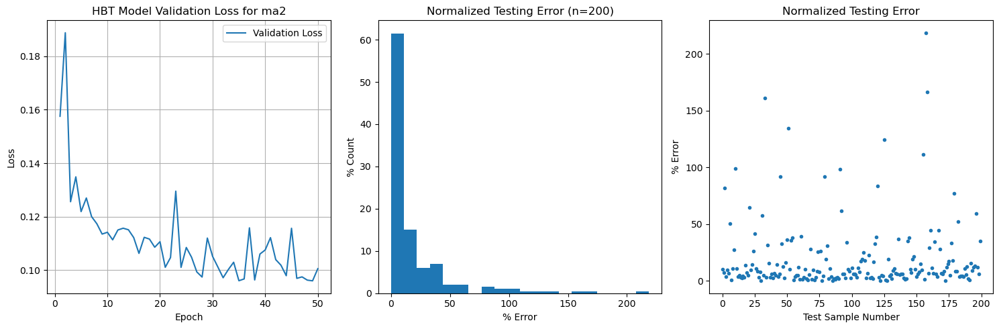

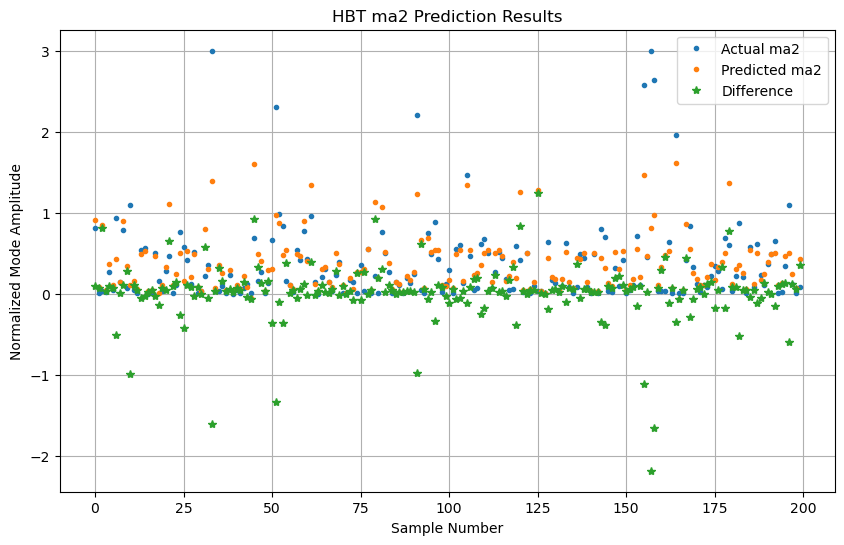

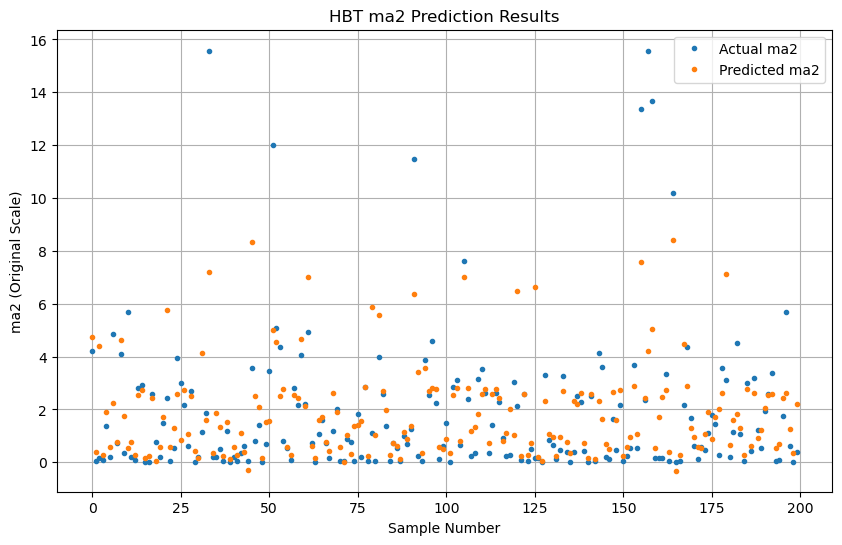

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 1.62
Mean absolute percentage error: 19.43%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

5.191251621246337
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


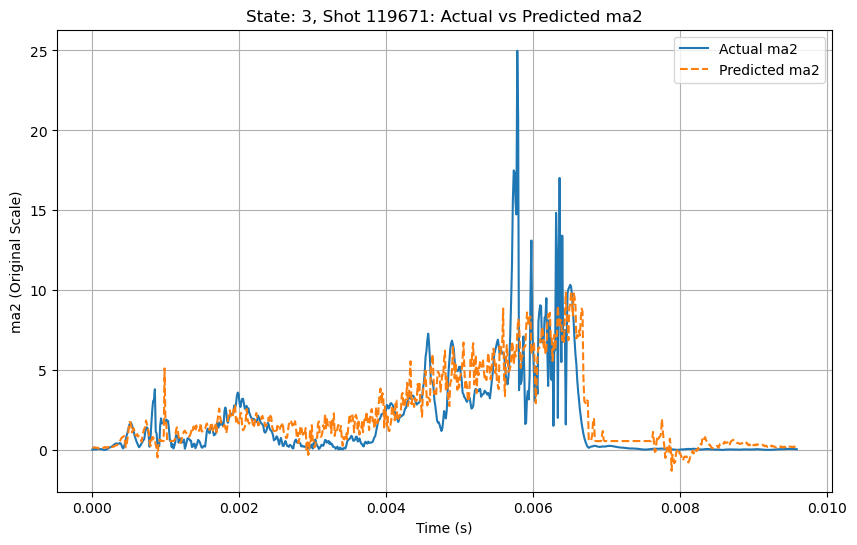

Shot 119671 - Mean absolute percentage error: 19.61%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 9.94


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
